### **Library dan Data**

In [3]:
!pip install importlib-metadata==4.13.0
!pip uninstall -y xarray netCDF4
!pip install netCDF4==1.5.0
!pip install xarray==0.19.0

Found existing installation: xarray 0.19.0
Uninstalling xarray-0.19.0:
  Successfully uninstalled xarray-0.19.0
Found existing installation: netCDF4 1.5.0
Uninstalling netCDF4-1.5.0:
  Successfully uninstalled netCDF4-1.5.0
  Using cached netCDF4-1.5.0-cp310-cp310-linux_x86_64.whl
  Using cached xarray-0.19.0-py3-none-any.whl (827 kB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
arviz 0.15.1 requires xarray>=0.21.0, but you have xarray 0.19.0 which is incompatible.
xarray-einstats 0.6.0 requires xarray>=2022.09.0, but you have xarray 0.19.0 which is incompatible.


In [4]:
#!pip install siphon netcdf4 cartopy==0.19.0.post1
#!pip install shapely --no-binary shapely --force
!pip install siphon cartopy

In [5]:
%matplotlib inline
import warnings
warnings.simplefilter('ignore') #ignores simple warning

import numpy as np
from datetime import datetime

from siphon.catalog import TDSCatalog
from xarray.backends import NetCDF4DataStore
import xarray as xr

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [6]:
#catalog
cat=TDSCatalog('https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/GFS_Global_0p25deg_20231017_0000.grib2/catalog.xml')

In [7]:
#dataset
ds=list(cat.datasets.values())[0]
#subset
ncss=ds.subset()
#query
query=ncss.query()

In [8]:
dir(query)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_format_time',
 '_set_query',
 'accept',
 'add_lonlat',
 'add_query_parameter',
 'all_times',
 'extra_params',
 'items',
 'lonlat_box',
 'lonlat_point',
 'projection_box',
 'spatial_query',
 'strides',
 'time',
 'time_query',
 'time_range',
 'var',
 'variables',
 'vertical_level']

In [9]:
ncss.variables

{'Absolute_vorticity_isobaric',
 'Albedo_surface_Mixed_intervals_Average',
 'Apparent_temperature_height_above_ground',
 'Best_4_layer_Lifted_Index_surface',
 'Categorical_Freezing_Rain_surface',
 'Categorical_Freezing_Rain_surface_Mixed_intervals_Average',
 'Categorical_Ice_Pellets_surface',
 'Categorical_Ice_Pellets_surface_Mixed_intervals_Average',
 'Categorical_Rain_surface',
 'Categorical_Rain_surface_Mixed_intervals_Average',
 'Categorical_Snow_surface',
 'Categorical_Snow_surface_Mixed_intervals_Average',
 'Cloud_Work_Function_entire_atmosphere_single_layer_Mixed_intervals_Average',
 'Cloud_mixing_ratio_hybrid',
 'Cloud_mixing_ratio_isobaric',
 'Cloud_water_entire_atmosphere_single_layer',
 'Composite_reflectivity_entire_atmosphere',
 'Convective_Precipitation_Rate_surface_Mixed_intervals_Average',
 'Convective_available_potential_energy_pressure_difference_layer',
 'Convective_available_potential_energy_surface',
 'Convective_inhibition_pressure_difference_layer',
 'Convective_

In [10]:
#dir(query)
tstart=datetime(2023,10,24,0,0)
tend=datetime(2023,10,26,21,0)

### **Precipitation_rate_surface**

In [117]:
varname='Precipitation_rate_surface'
query.lonlat_box(north=15, south=-15, east=150, west=95)
query.time_range(start=tstart,end=tend)
query.accept('netcdf4')
query.variables(varname)

var=Precipitation_rate_surface&time_start=2023-10-24T00%3A00%3A00&time_end=2023-10-26T21%3A00%3A00&west=95&east=150&south=-15&north=15&accept=netcdf4

In [118]:
#get data
data = ncss.get_data(query)
data = xr.open_dataset(NetCDF4DataStore(data))
data

<xarray.Dataset>
Dimensions:                        (time3: 24, latitude: 121, longitude: 221)
Coordinates:
  * time3                          (time3) datetime64[ns] 2023-10-24 ... 2023...
    reftime                        datetime64[ns] ...
  * latitude                       (latitude) float32 15.0 14.75 ... -15.0
  * longitude                      (longitude) float32 95.0 95.25 ... 150.0
Data variables:
    Precipitation_rate_surface     (time3, latitude, longitude) float32 ...
    LatLon_721X1440-0p13S-180p00E  int32 ...
Attributes: (12/13)
    Originating_or_generating_Center:                                        ...
    Originating_or_generating_Subcenter:                                     ...
    GRIB_table_version:                                                      ...
    Type_of_generating_process:                                              ...
    Analysis_or_forecast_generating_process_identifier_defined_by_originating...
    Conventions:                                                             ...
    ...                                                                                ...
    featureType:                                                             ...
    History:                                                                 ...
    geospatial_lat_min:                                                      ...
    geospatial_lat_max:                                                      ...
    geospatial_lon_min:                                                      ...
    geospatial_lon_max:                                                      ...

In [119]:
import warnings
warnings.simplefilter('ignore') #ignores simple warning
from siphon.catalog import TDSCatalog
from xarray.backends import NetCDF4DataStore
import xarray as xr

def timelagGFS(file_list,varname,domain,valid_time_start,valid_time_end):
  '''
  Fungsi sederhana untuk membuat time-lag ensemble dari data GFS
  '''
  #member-1
  m= TDSCatalog(file_list[0])
  print(m)
  ds=list(m.datasets.values())[0]
  ncss=ds.subset()
  query=ncss.query()
  query.lonlat_box(north=domain['north'], south=domain['south'], east=domain['east'], west=domain['west'])
  query.time_range(start=valid_time_start,end=valid_time_end)
  query.accept('netcdf4')
  query.variables(varname)
  #get data
  data = xr.open_dataset(NetCDF4DataStore(ncss.get_data(query)))
  data=data.rename({data[varname].dims[0]: 'time'})

  #member lainnya
  for mem in file_list[1:]:
    m= TDSCatalog(mem)
    print(m)
    ds=list(m.datasets.values())[0]
    ncss=ds.subset()

    query=ncss.query()
    query.lonlat_box(north=llbox['north'], south=llbox['south'], east=llbox['east'], west=llbox['west'])
    query.time_range(start=valid_s,end=valid_e)
    query.accept('netcdf4')
    query.variables(varname)

    #get data
    dat = xr.open_dataset(NetCDF4DataStore(ncss.get_data(query)))
    dat=dat.rename({dat[varname].dims[0]: 'time'})

    #concatenate
    data=xr.concat([data,dat],"member")

  return data


In [120]:
time_lag_list=['https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/GFS_Global_0p25deg_20231023_0000.grib2/catalog.xml',
               'https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/GFS_Global_0p25deg_20231023_0600.grib2/catalog.xml',
               'https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/GFS_Global_0p25deg_20231023_1200.grib2/catalog.xml',
               'https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/GFS_Global_0p25deg_20231023_1800.grib2/catalog.xml',
               'https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/GFS_Global_0p25deg_20231022_0000.grib2/catalog.xml',
               'https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/GFS_Global_0p25deg_20231022_0600.grib2/catalog.xml',
               'https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/GFS_Global_0p25deg_20231022_1200.grib2/catalog.xml',
               'https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/GFS_Global_0p25deg_20231022_1800.grib2/catalog.xml',
               'https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/GFS_Global_0p25deg_20231021_0000.grib2/catalog.xml',
               'https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/GFS_Global_0p25deg_20231021_0600.grib2/catalog.xml',
               'https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/GFS_Global_0p25deg_20231021_1200.grib2/catalog.xml',
               'https://thredds.ucar.edu/thredds/catalog/grib/NCEP/GFS/Global_0p25deg/GFS_Global_0p25deg_20231021_1800.grib2/catalog.xml']

In [121]:
#parameter subset
varname='Precipitation_rate_surface'
llbox={'north':15,
       'south':-15,
       'west':90,
       'east':150}
valid_s=datetime(2023,10,24,0,0)
valid_e=datetime(2023,10,26,21,0)

In [122]:
tlag_ens=timelagGFS(time_lag_list,varname,llbox,valid_s,valid_e)

GFS_Global_0p25deg_20231023_0000.grib2


GFS_Global_0p25deg_20231023_0600.grib2


GFS_Global_0p25deg_20231023_1200.grib2


GFS_Global_0p25deg_20231023_1800.grib2


GFS_Global_0p25deg_20231022_0000.grib2


GFS_Global_0p25deg_20231022_0600.grib2


GFS_Global_0p25deg_20231022_1200.grib2


GFS_Global_0p25deg_20231022_1800.grib2


GFS_Global_0p25deg_20231021_0000.grib2


GFS_Global_0p25deg_20231021_0600.grib2


GFS_Global_0p25deg_20231021_1200.grib2


GFS_Global_0p25deg_20231021_1800.grib2


In [123]:
tlag_ens[varname]

<xarray.DataArray 'Precipitation_rate_surface' (member: 12, time: 24, latitude: 121, longitude: 241)>
array([[[[0.0000e+00, 0.0000e+00, 4.0000e-07, ..., 2.7200e-05,
          2.0000e-06, 2.4000e-06],
         [0.0000e+00, 4.0000e-07, 1.2000e-06, ..., 6.4000e-06,
          6.4000e-06, 5.6000e-06],
         [0.0000e+00, 4.0000e-07, 1.6000e-06, ..., 7.6000e-06,
          8.8000e-06, 2.2800e-05],
         ...,
         [6.9200e-05, 4.8000e-06, 4.0000e-07, ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         [3.9200e-05, 4.4000e-06, 0.0000e+00, ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         [1.1600e-05, 4.0000e-07, 2.0000e-06, ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00]],

        [[2.1600e-05, 1.9200e-05, 7.2000e-06, ..., 2.4000e-06,
          1.6000e-06, 1.6000e-06],
         [1.6000e-05, 2.4000e-06, 0.0000e+00, ..., 1.6000e-06,
          1.6000e-06, 2.4000e-06],
         [4.8000e-06, 0.0000e+00, 0.0000e+00, ..., 1.2880e-04,
          1.6000e-06, 1.6000e-06],
...
         [1.1200e-05, 1.1200e-05, 1.5600e-05, ..., 4.0000e-07,
          8.0000e-07, 4.0000e-07],
         [1.6000e-05, 7.2000e-06, 8.0000e-06, ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         [4.1200e-05, 1.2400e-05, 6.8000e-06, ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00]],

        [[0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00,
          1.2000e-06, 0.0000e+00],
         [0.0000e+00, 1.2000e-06, 0.0000e+00, ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         ...,
         [5.9600e-05, 1.7200e-05, 1.4000e-05, ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         [4.8800e-05, 5.9600e-05, 1.7600e-05, ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00],
         [1.2000e-06, 1.8000e-05, 1.0000e-05, ..., 0.0000e+00,
          0.0000e+00, 0.0000e+00]]]], dtype=float32)
Coordinates:
  * time       (time) datetime64[ns] 2023-10-24 ... 2023-10-26T21:00:00
    reftime    (member) datetime64[ns] 2023-10-23 ... 2023-10-21T18:00:00
  * latitude   (latitude) float32 15.0 14.75 14.5 14.25 ... -14.5 -14.75 -15.0
  * longitude  (longitude) float32 90.0 90.25 90.5 90.75 ... 149.5 149.8 150.0
Dimensions without coordinates: member
Attributes:
    long_name:                       Precipitation rate @ Ground or water sur...
    units:                           kg.m-2.s-1
    Grib_Variable_Id:                VAR_0-1-7_L1
    Grib2_Parameter:                 [0 1 7]
    Grib2_Parameter_Discipline:      Meteorological products
    Grib2_Parameter_Category:        Moisture
    Grib2_Parameter_Name:            Precipitation rate
    Grib2_Level_Type:                1
    Grib2_Level_Desc:                Ground or water surface
    Grib2_Generating_Process_Type:   Forecast
    Grib2_Statistical_Process_Type:  UnknownStatType--1
    grid_mapping:                    LatLon_721X1440-0p13S-180p00E

In [124]:
tlag_ens_3=tlag_ens*3600*3 #akumulasi ch 3 jam (mm/3jam)

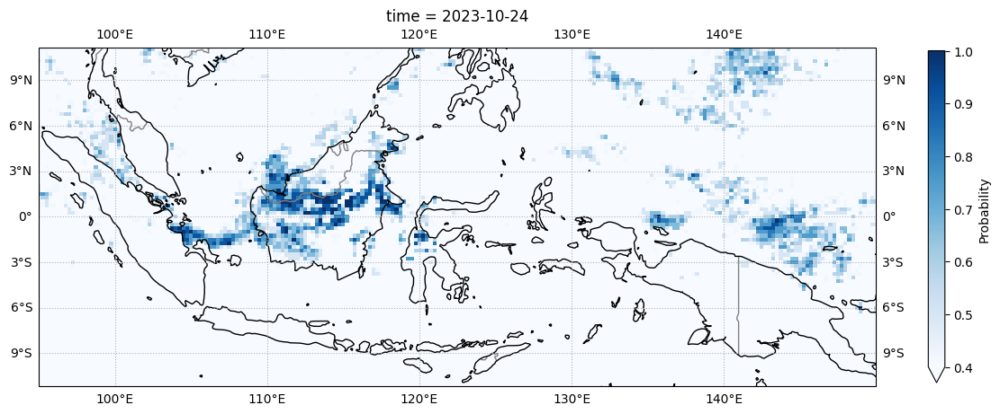

In [125]:
time='2023-10-24 00:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

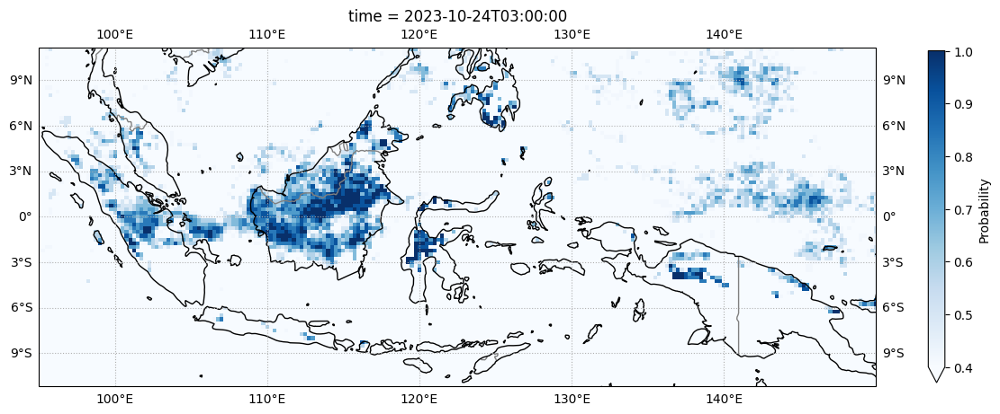

In [126]:
time='2023-10-24 03:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

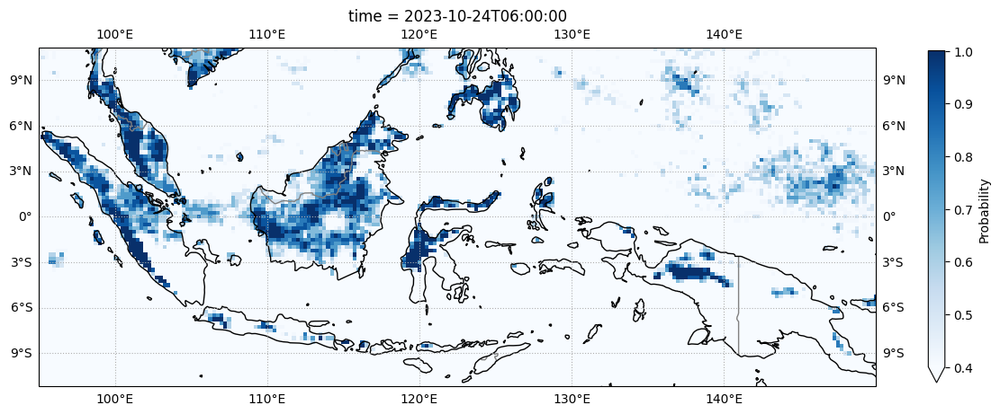

In [127]:
time='2023-10-24 06:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

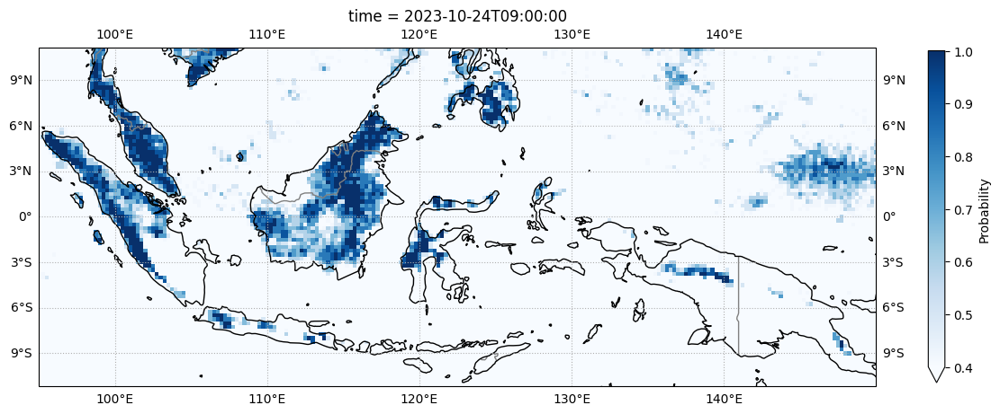

In [128]:
time='2023-10-24 09:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

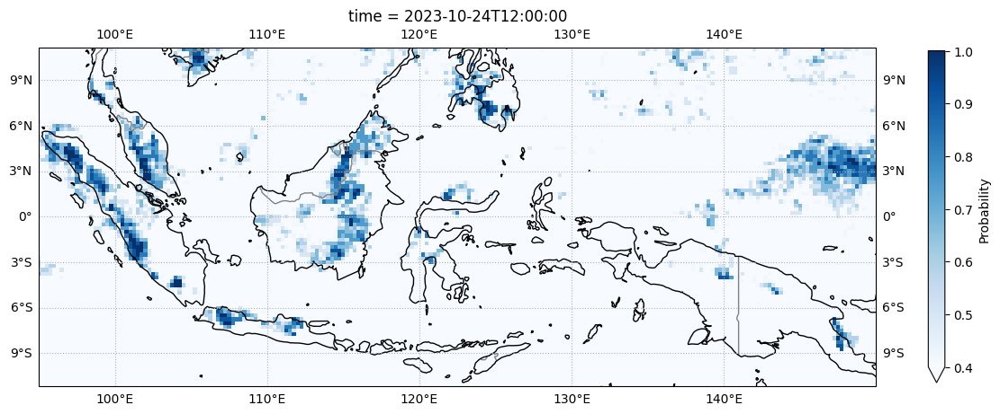

In [129]:
time='2023-10-24 12:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

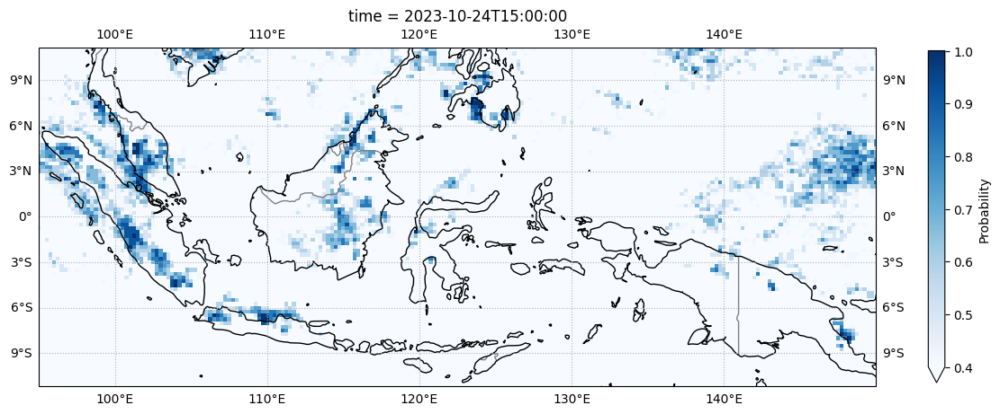

In [130]:
time='2023-10-24 15:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

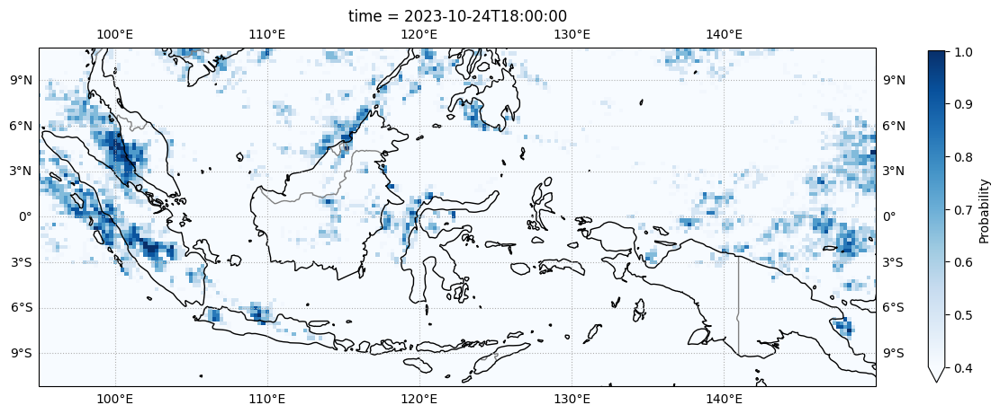

In [131]:
time='2023-10-24 18:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

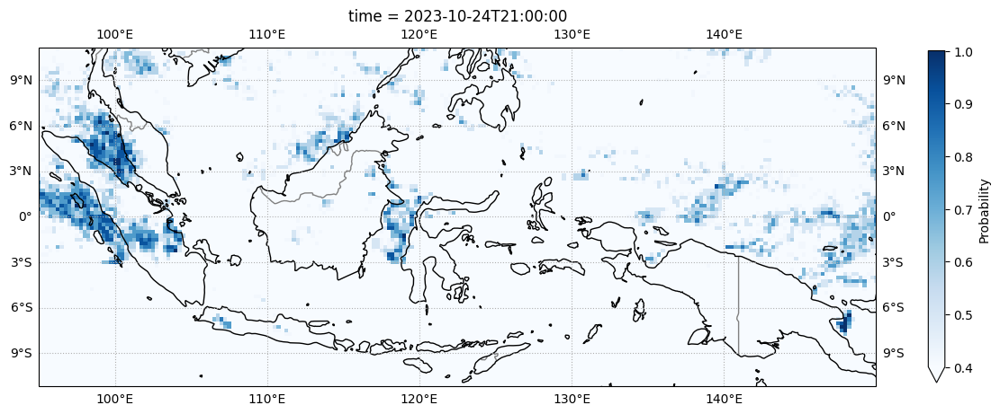

In [132]:
time='2023-10-24 21:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

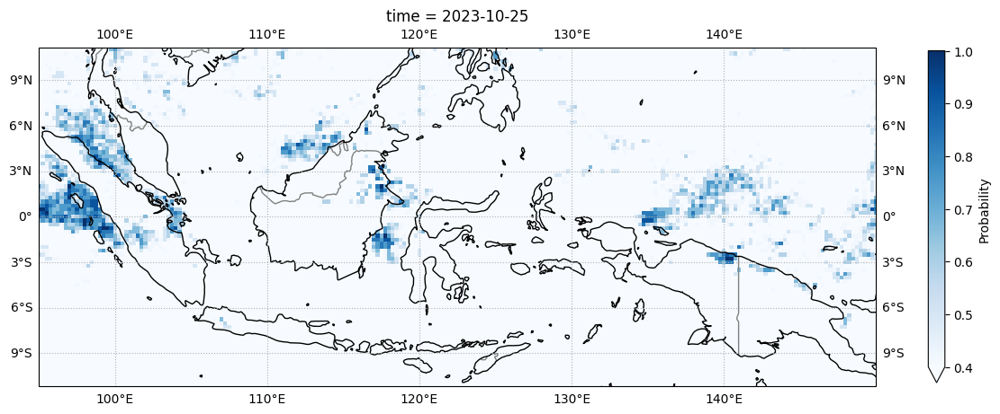

In [133]:
time='2023-10-25 00:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

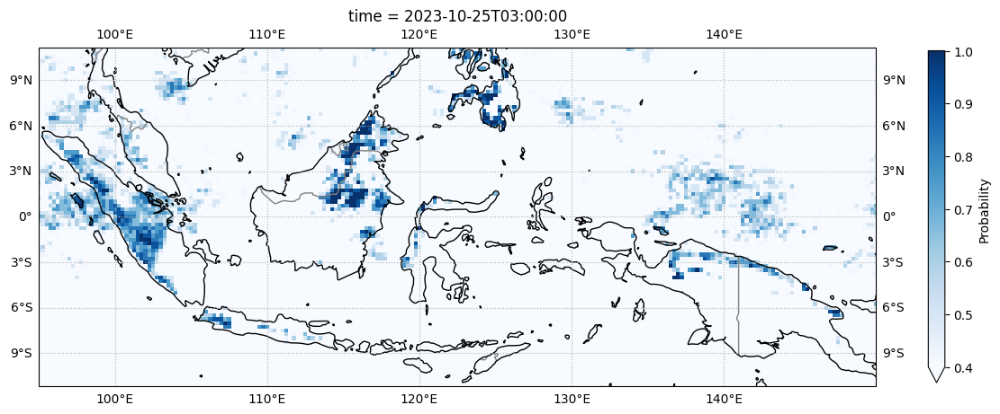

In [134]:
time='2023-10-25 03:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

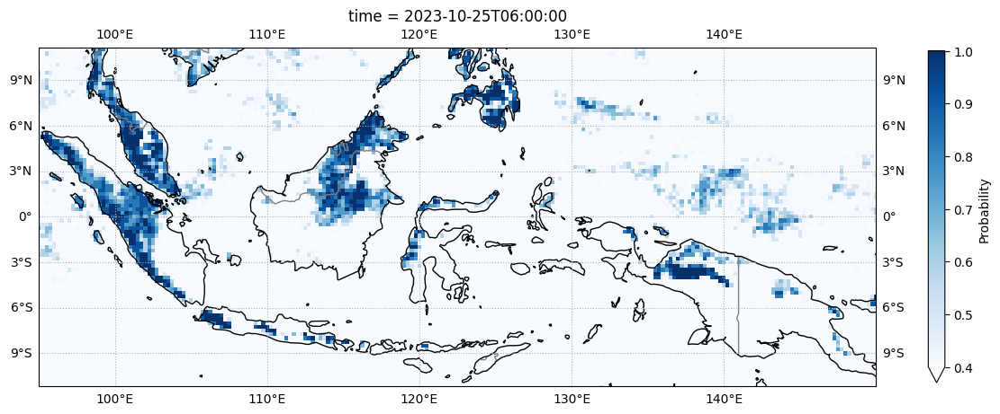

In [135]:
time='2023-10-25 06:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

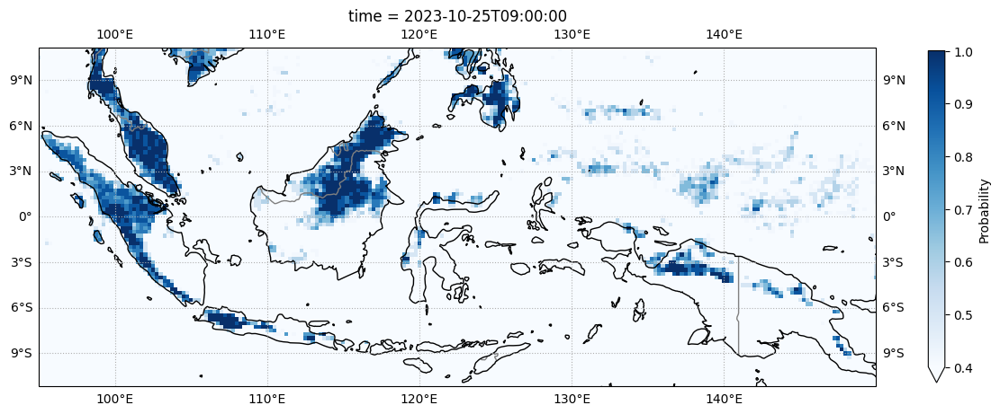

In [136]:
time='2023-10-25 09:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

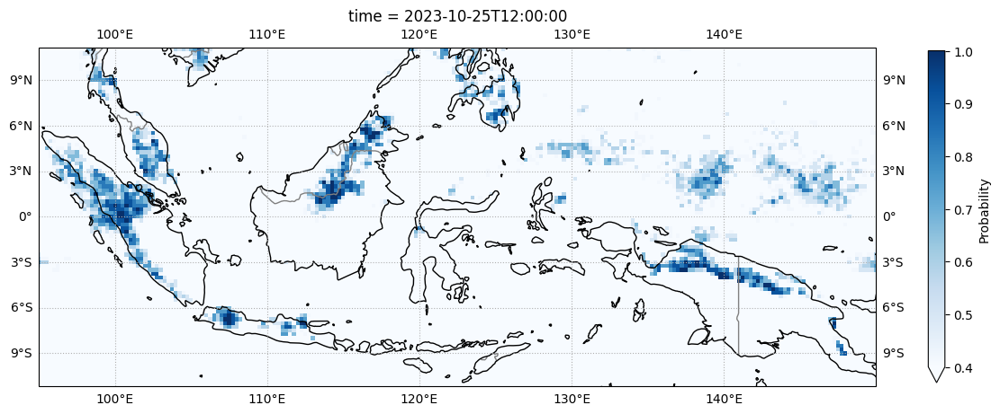

In [137]:
time='2023-10-25 12:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

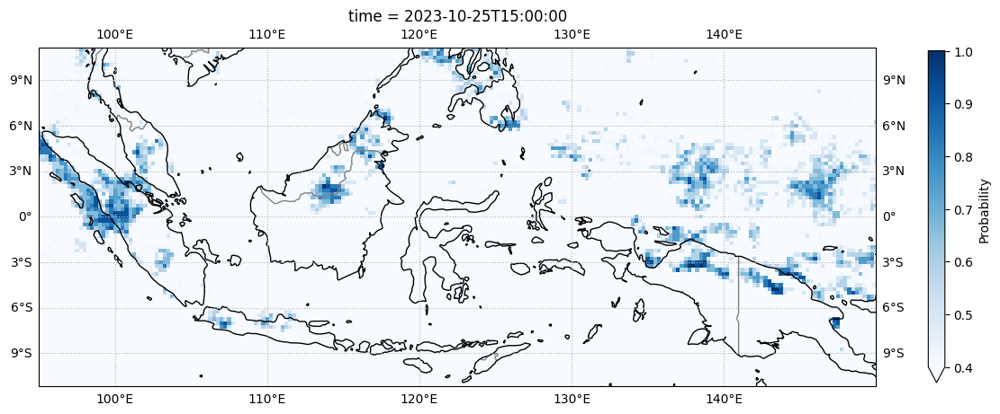

In [138]:
time='2023-10-25 15:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

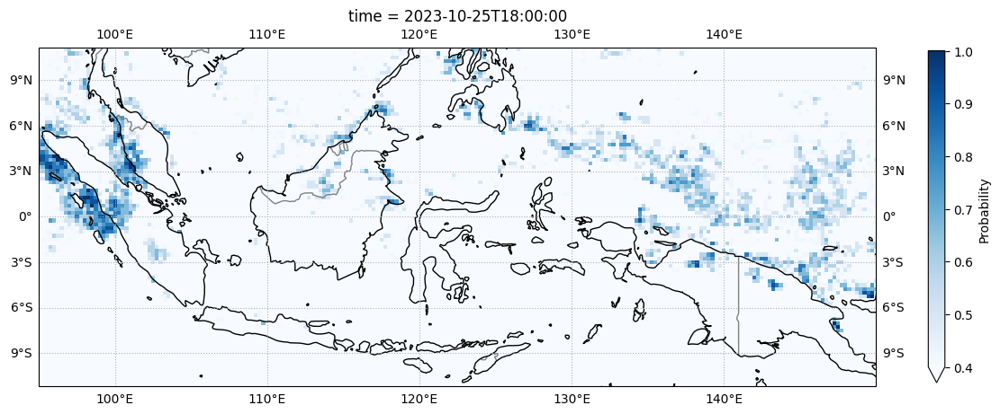

In [139]:
time='2023-10-25 18:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

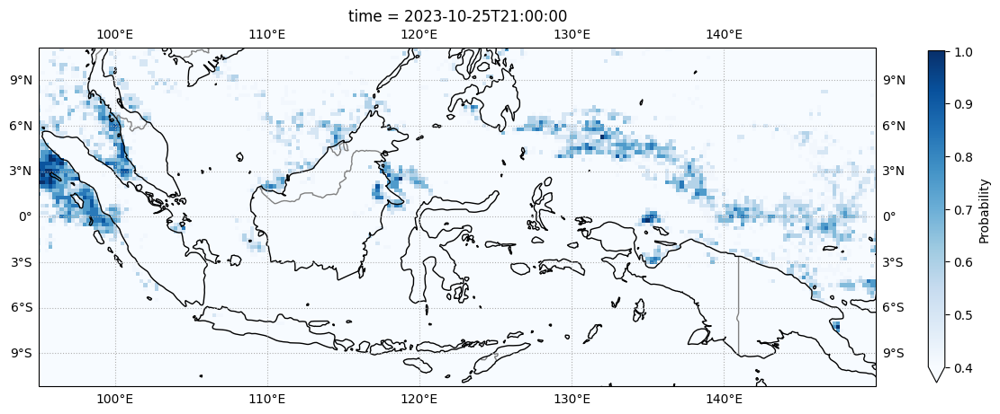

In [140]:
time='2023-10-25 21:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

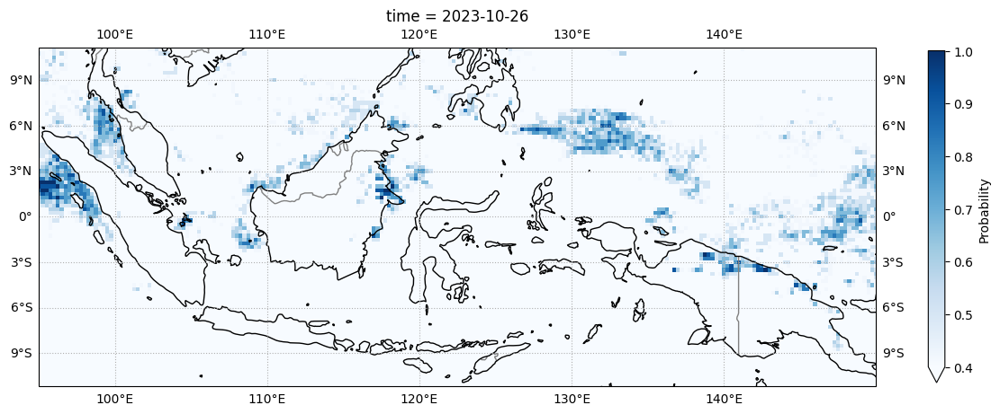

In [141]:
time='2023-10-26 00:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

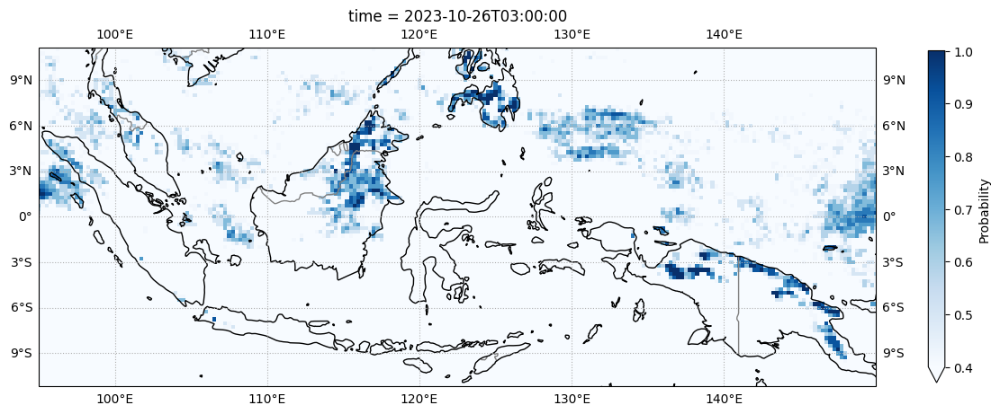

In [142]:
time='2023-10-26 03:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

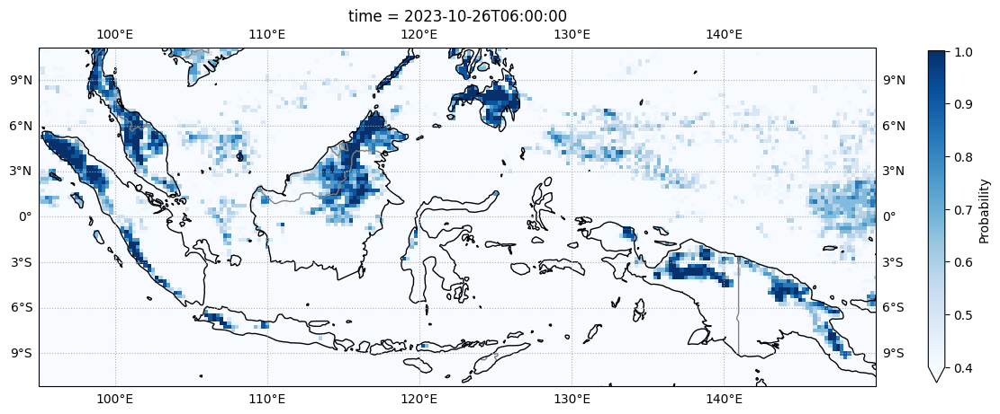

In [143]:
time='2023-10-26 06:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

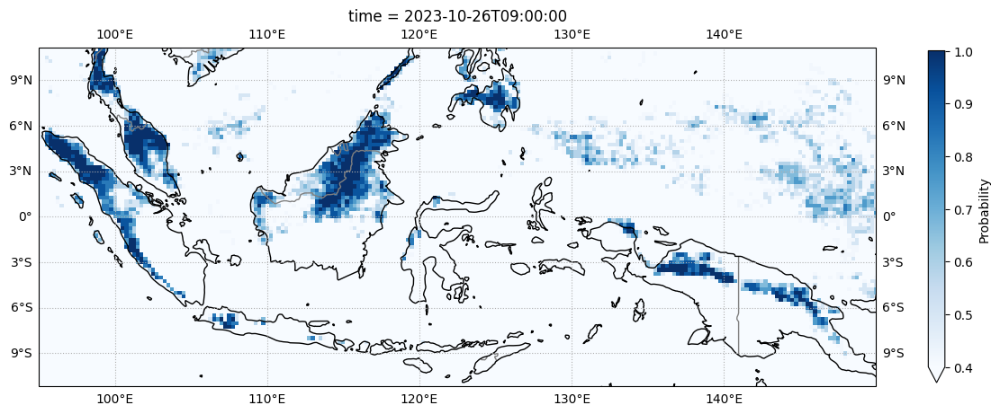

In [144]:
time='2023-10-26 09:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

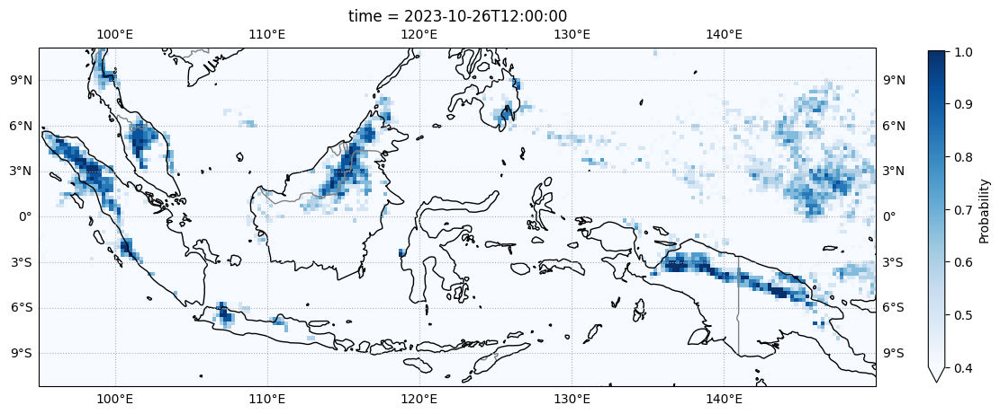

In [145]:
time='2023-10-26 12:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

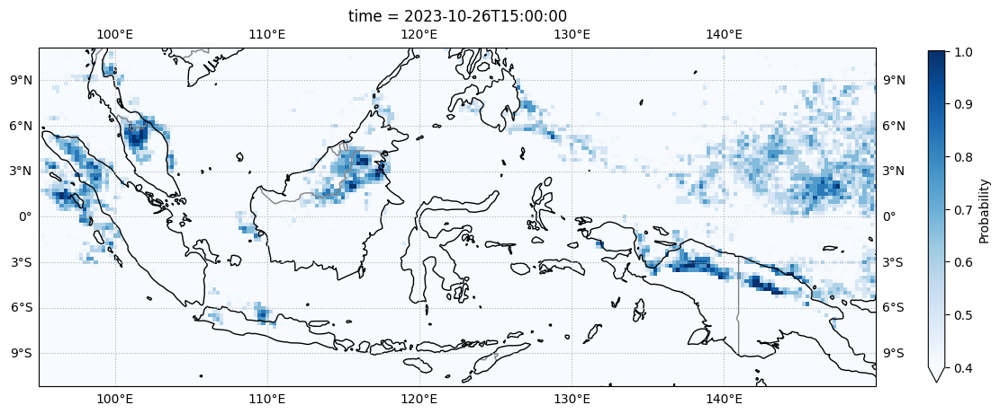

In [146]:
time='2023-10-26 15:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

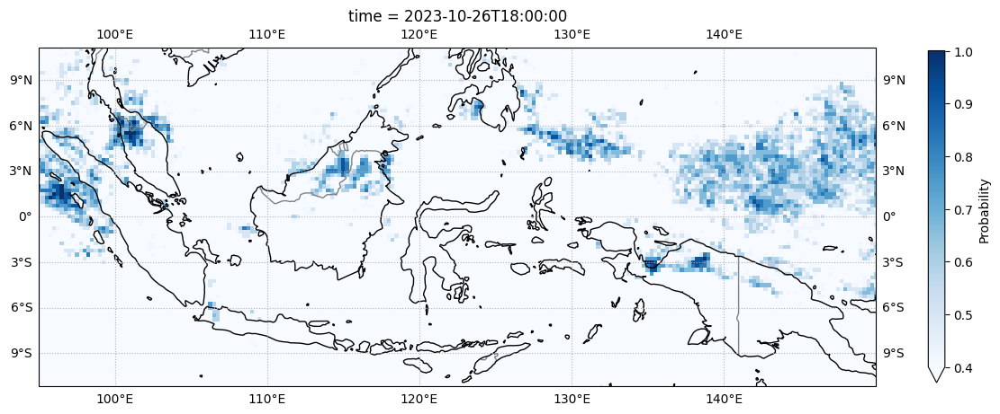

In [147]:
time='2023-10-26 18:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

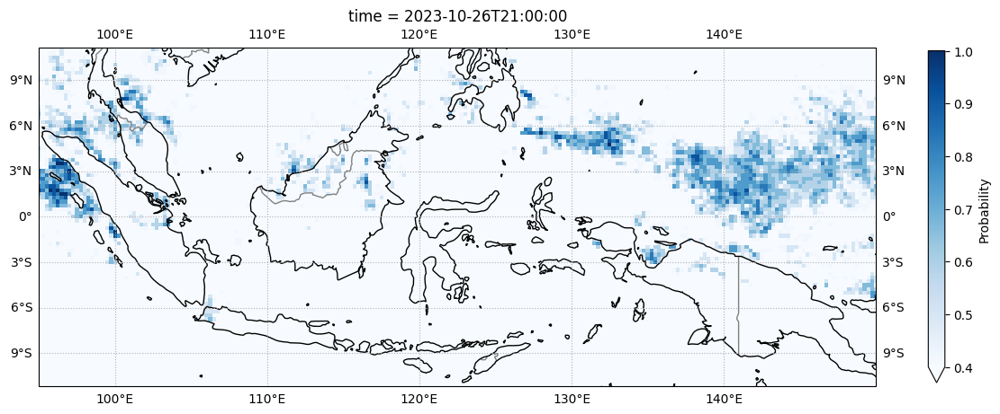

In [148]:
time='2023-10-26 21:00'

thold=0.7 #threshold

#probabilitas value > thold
dat=tlag_ens_3[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/12

#gambar
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.4,
          vmax=1.0,
          cmap='Blues',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

### **Total_cloud_cover_entire_atmosphere**

In [50]:
varname='Total_cloud_cover_entire_atmosphere'
cl_cover=timelagGFS(time_lag_list,varname,llbox,valid_s,valid_e)

GFS_Global_0p25deg_20231023_0000.grib2


GFS_Global_0p25deg_20231023_0600.grib2


GFS_Global_0p25deg_20231023_1200.grib2


GFS_Global_0p25deg_20231023_1800.grib2


GFS_Global_0p25deg_20231022_0000.grib2


GFS_Global_0p25deg_20231022_0600.grib2


GFS_Global_0p25deg_20231022_1200.grib2


GFS_Global_0p25deg_20231022_1800.grib2


GFS_Global_0p25deg_20231021_0000.grib2


GFS_Global_0p25deg_20231021_0600.grib2


GFS_Global_0p25deg_20231021_1200.grib2


GFS_Global_0p25deg_20231021_1800.grib2


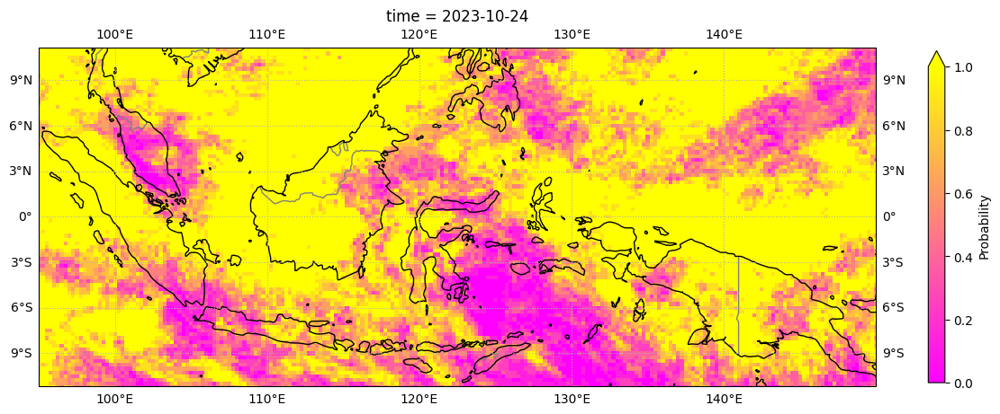

In [54]:
time='2023-10-24 00:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

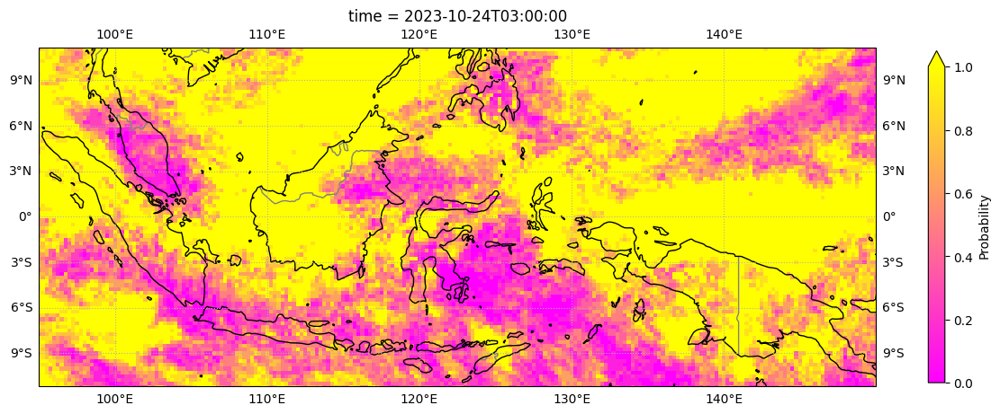

In [55]:
time='2023-10-24 03:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

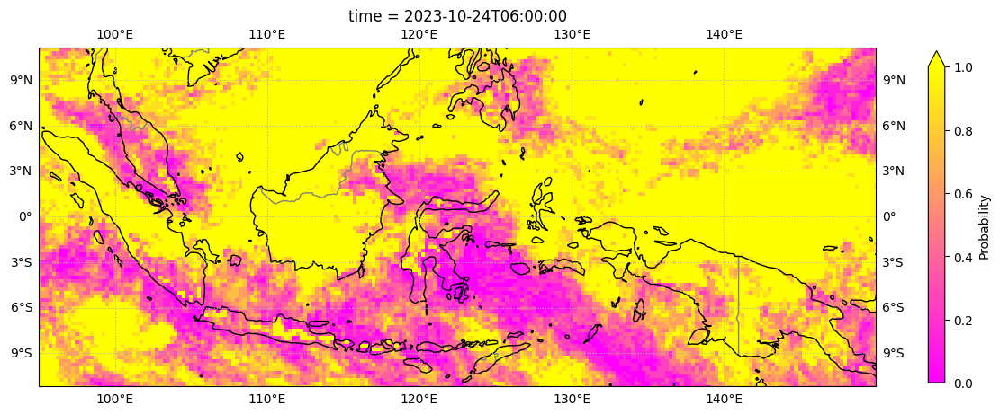

In [56]:
time='2023-10-24 06:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

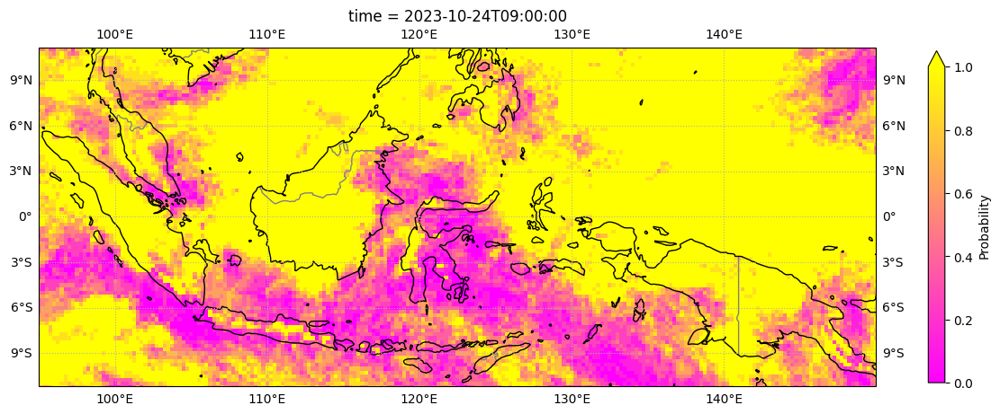

In [57]:
time='2023-10-24 09:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

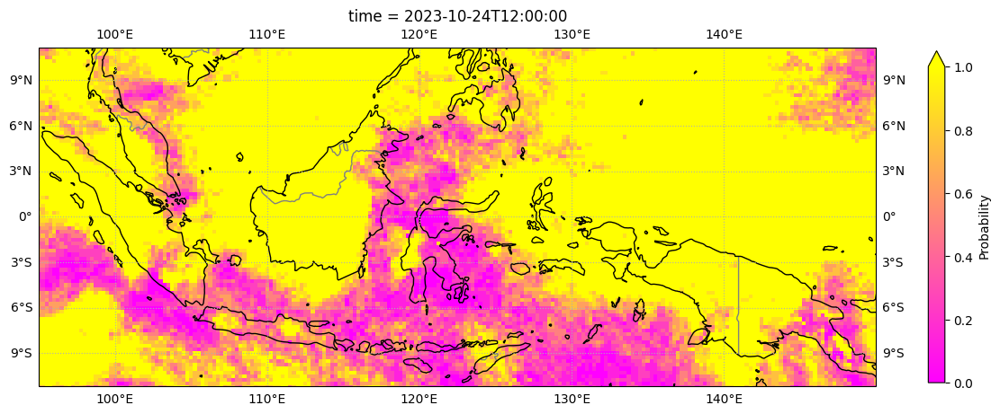

In [58]:
time='2023-10-24 12:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

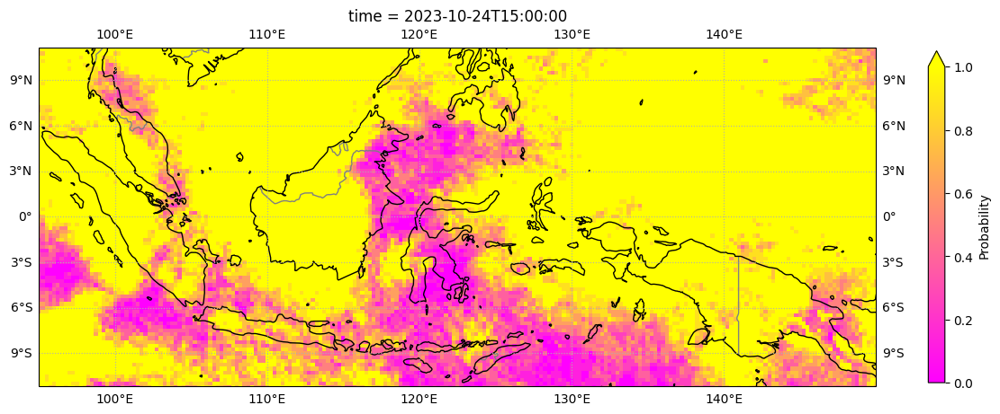

In [59]:
time='2023-10-24 15:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

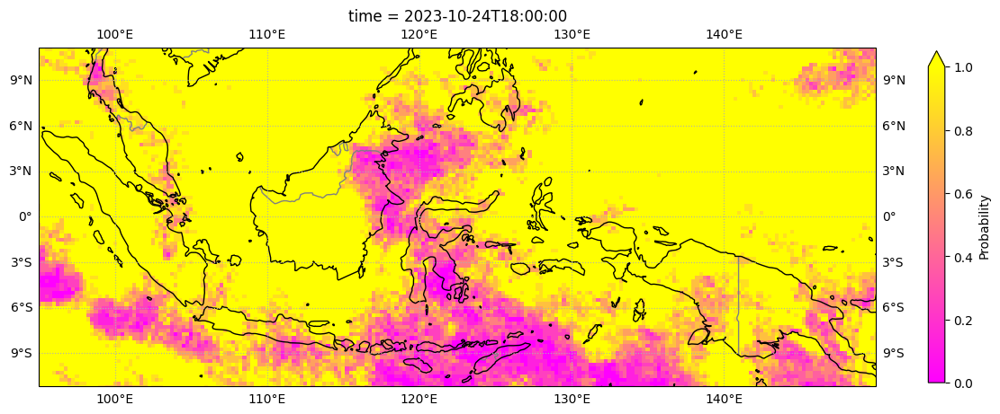

In [60]:
time='2023-10-24 18:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

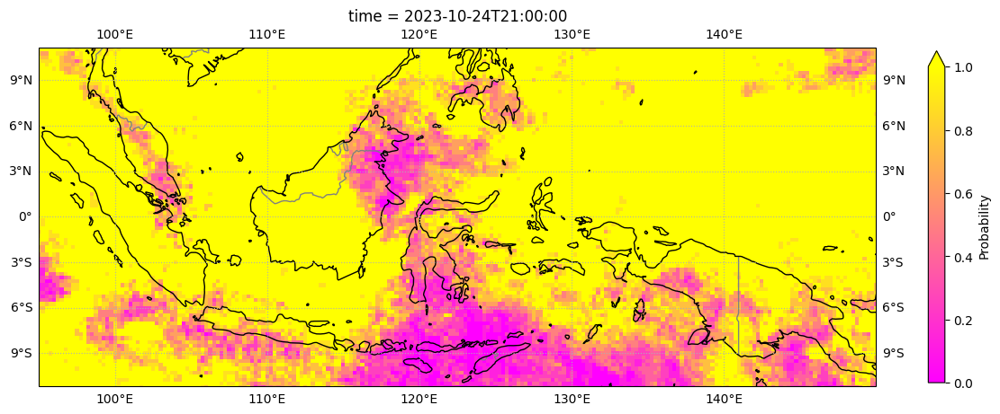

In [61]:
time='2023-10-24 21:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

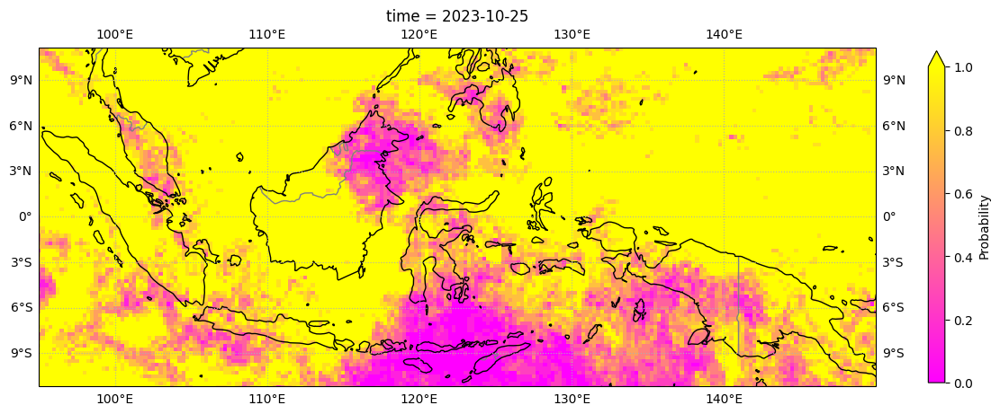

In [62]:
time='2023-10-25 00:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

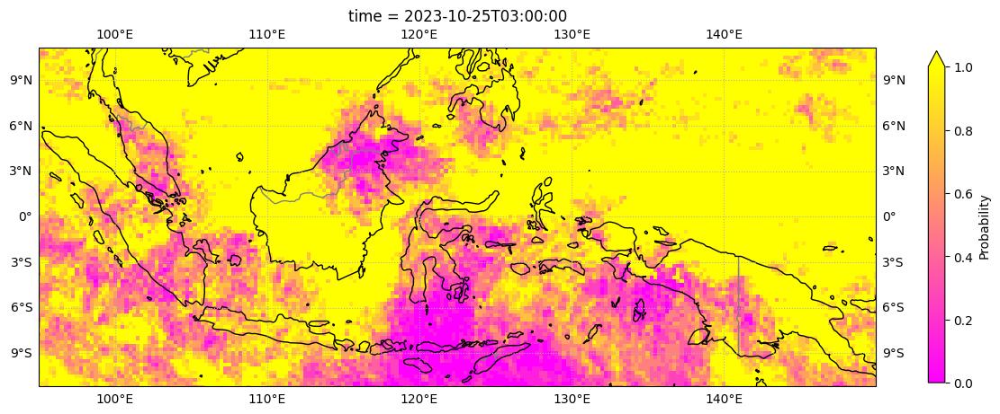

In [63]:
time='2023-10-25 03:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

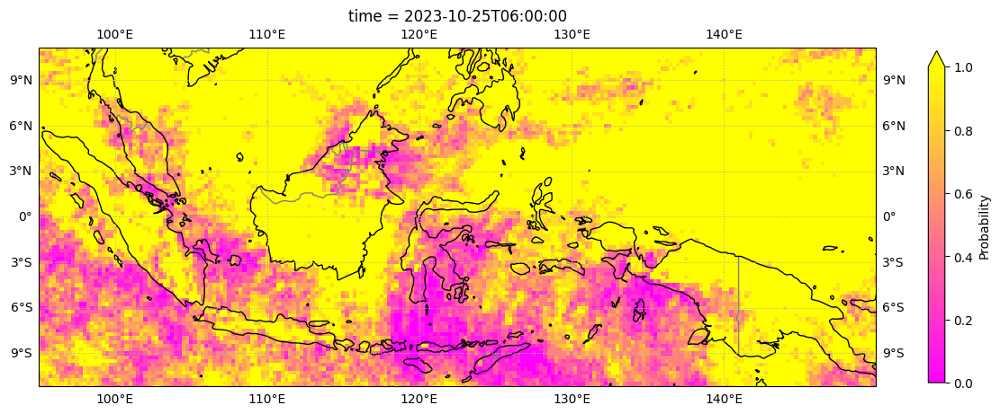

In [64]:
time='2023-10-25 06:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

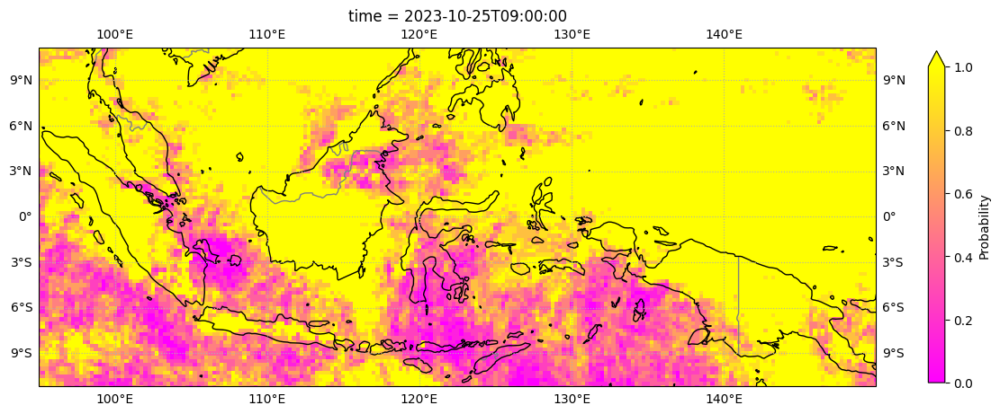

In [65]:
time='2023-10-25 09:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

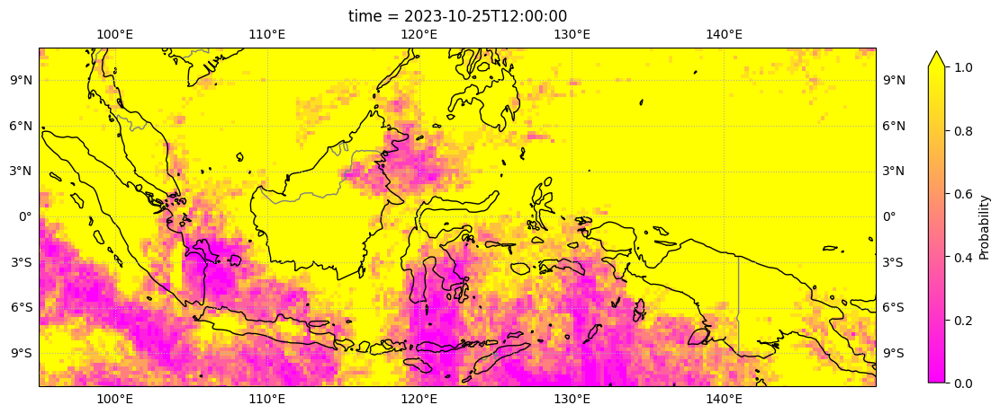

In [66]:
time='2023-10-25 12:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

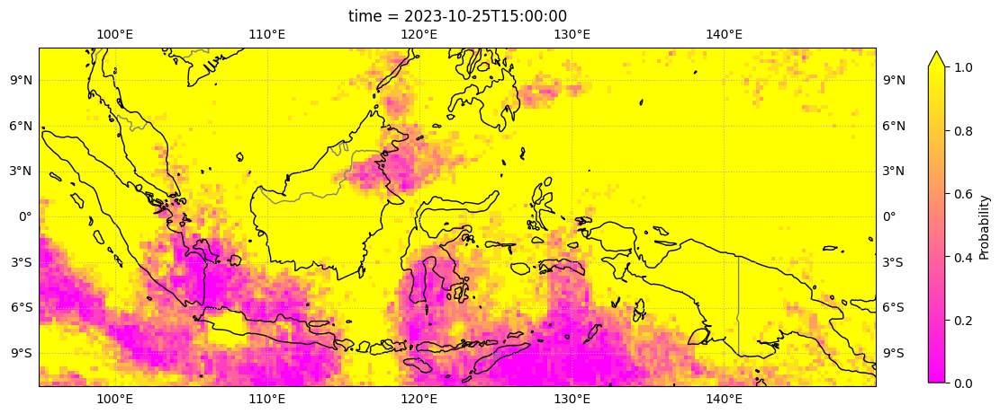

In [67]:
time='2023-10-25 15:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

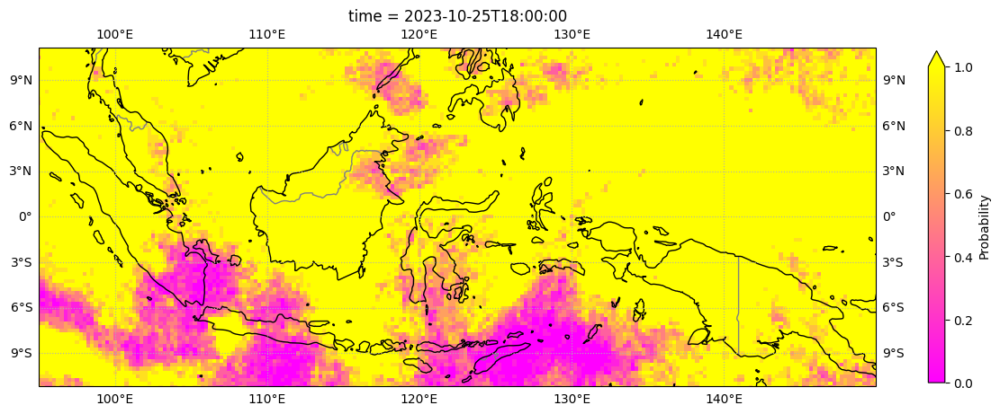

In [68]:
time='2023-10-25 18:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

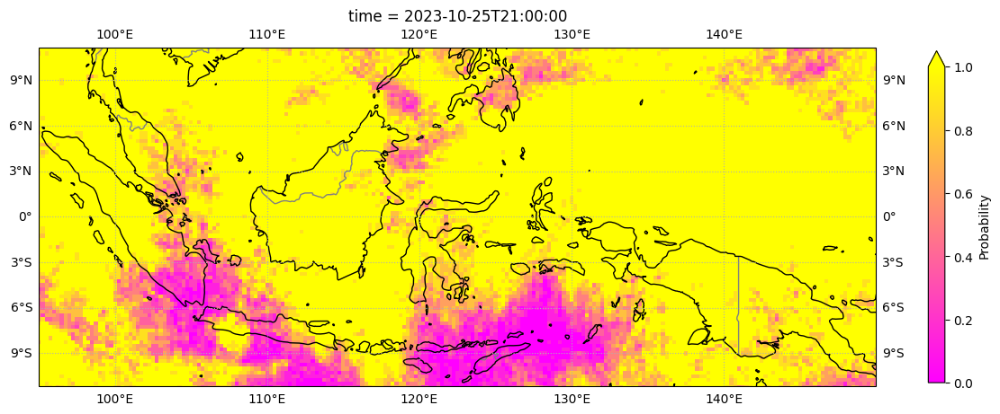

In [69]:
time='2023-10-25 21:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

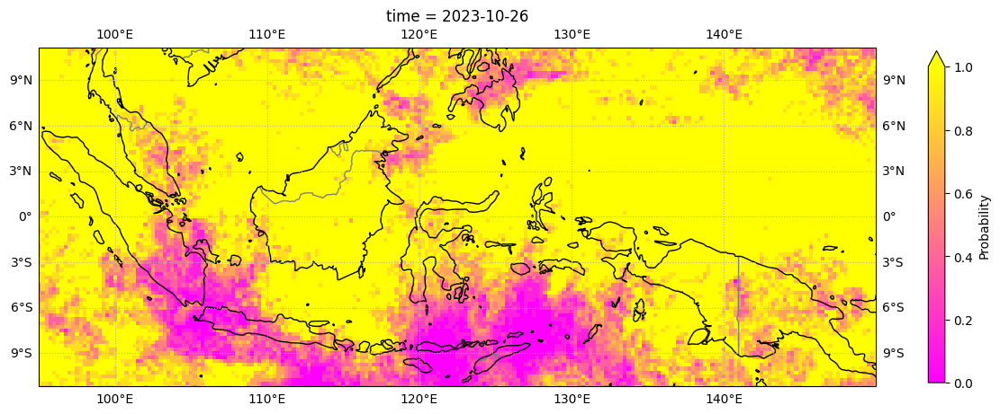

In [70]:
time='2023-10-26 00:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

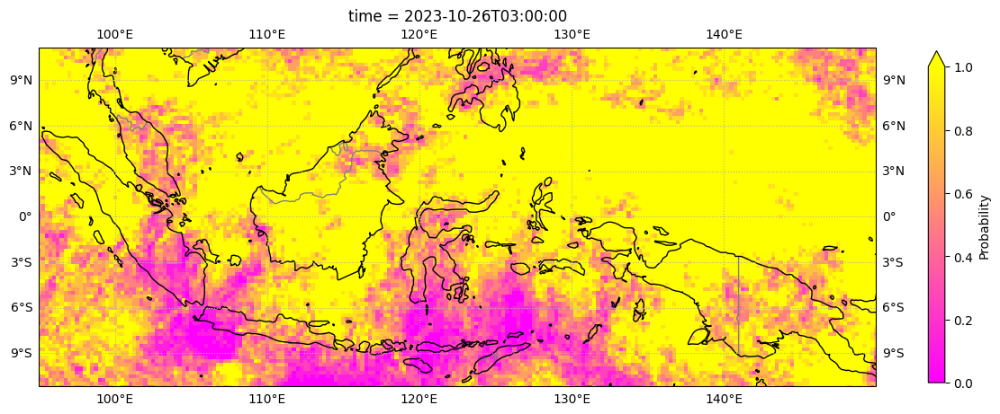

In [72]:
time='2023-10-26 03:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

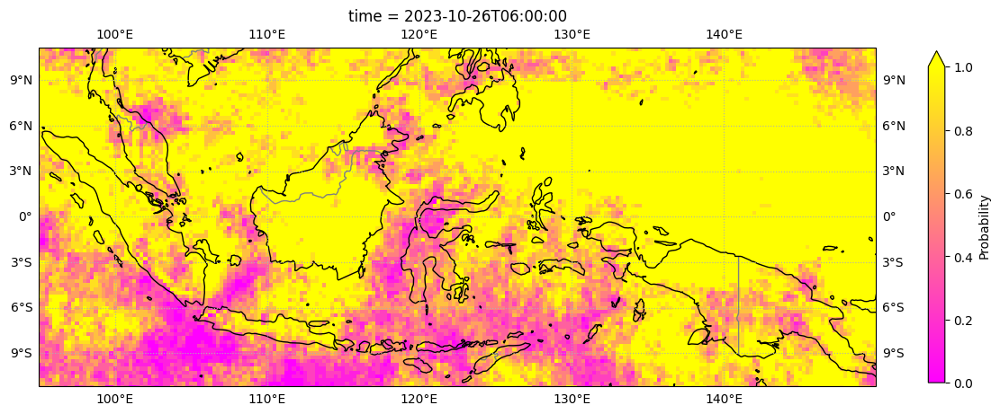

In [78]:
time='2023-10-26 06:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

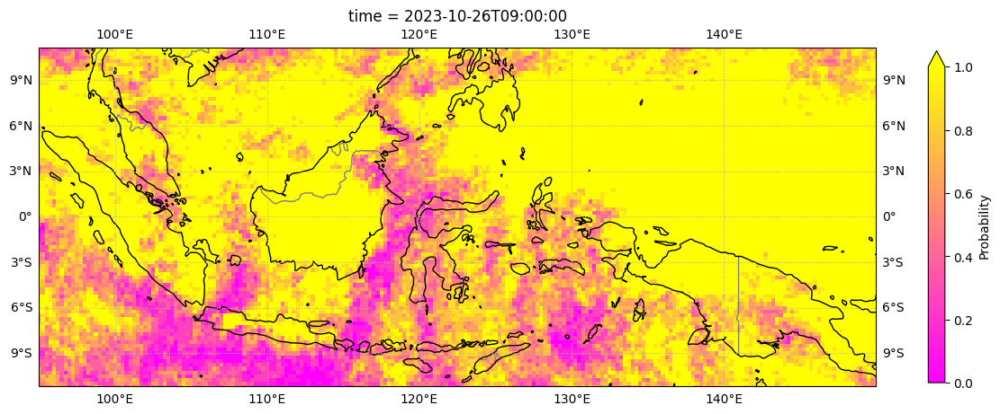

In [73]:
time='2023-10-26 09:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

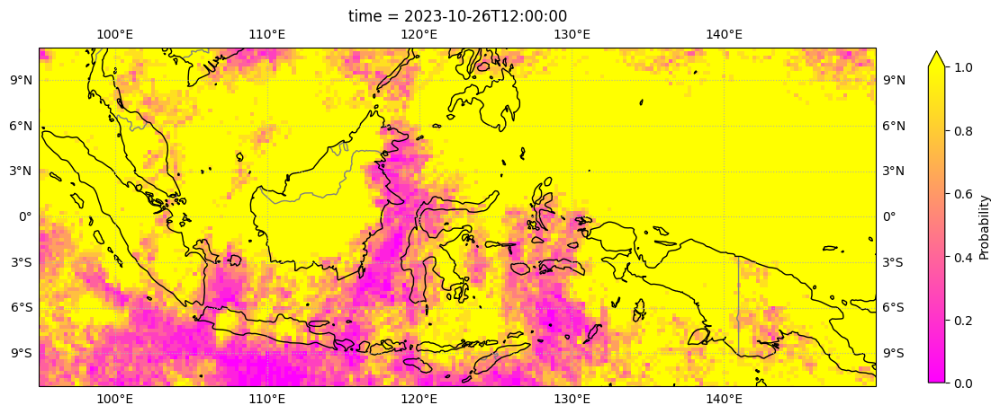

In [74]:
time='2023-10-26 12:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

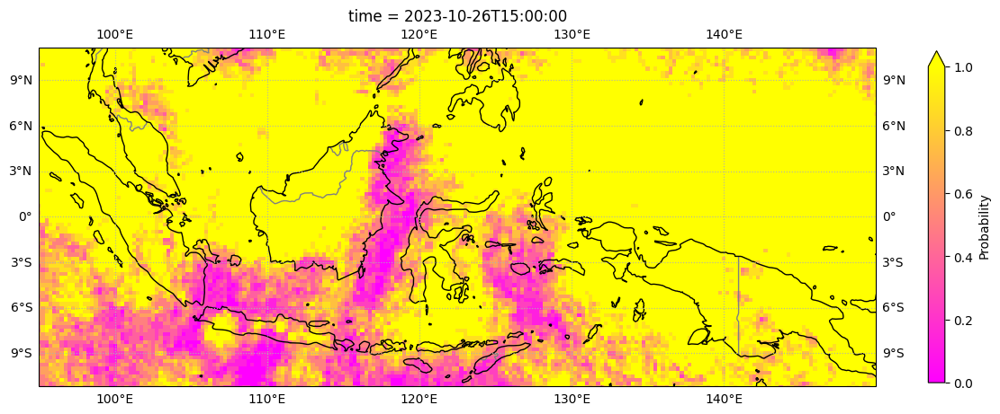

In [75]:
time='2023-10-26 15:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

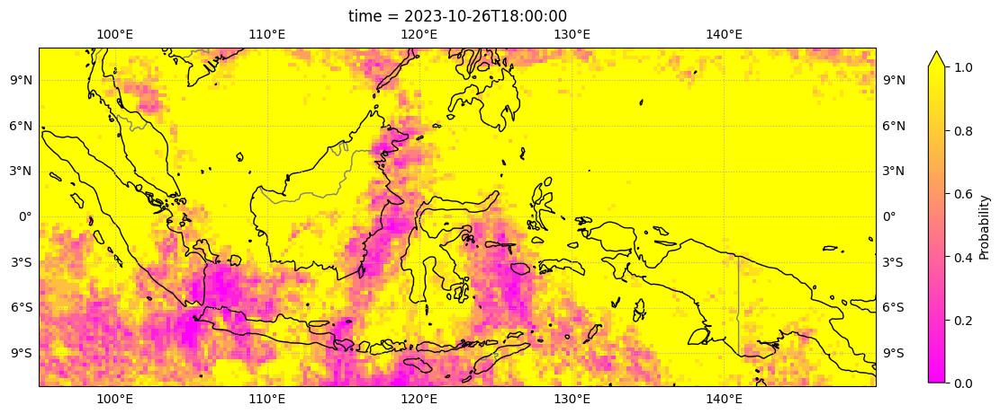

In [76]:
time='2023-10-26 18:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

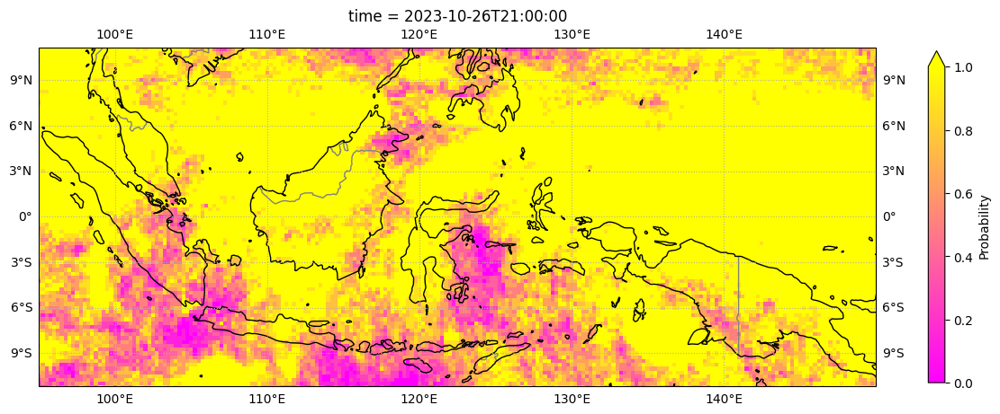

In [77]:
time='2023-10-26 21:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='spring',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

###**Vegetation_surface**

In [151]:
varname='Vegetation_surface'
cl_cover1=timelagGFS(time_lag_list,varname,llbox,valid_s,valid_e)

GFS_Global_0p25deg_20231023_0000.grib2


GFS_Global_0p25deg_20231023_0600.grib2


GFS_Global_0p25deg_20231023_1200.grib2


GFS_Global_0p25deg_20231023_1800.grib2


GFS_Global_0p25deg_20231022_0000.grib2


GFS_Global_0p25deg_20231022_0600.grib2


GFS_Global_0p25deg_20231022_1200.grib2


GFS_Global_0p25deg_20231022_1800.grib2


GFS_Global_0p25deg_20231021_0000.grib2


GFS_Global_0p25deg_20231021_0600.grib2


GFS_Global_0p25deg_20231021_1200.grib2


GFS_Global_0p25deg_20231021_1800.grib2


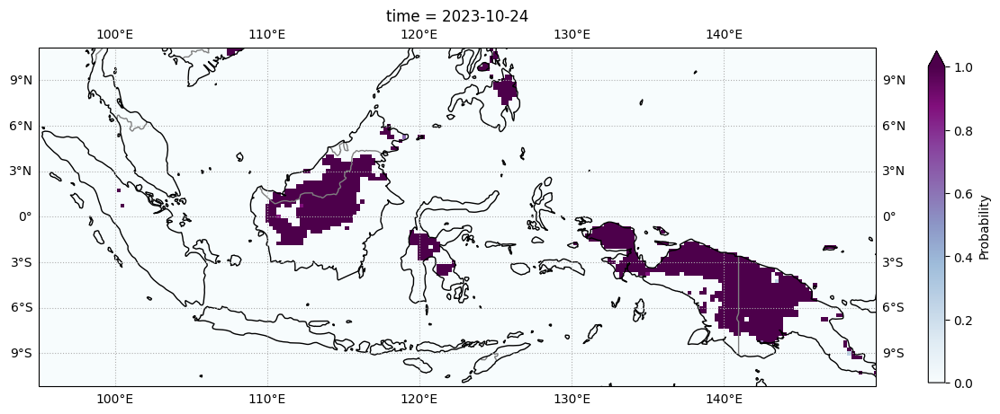

In [152]:
time='2023-10-24 00:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

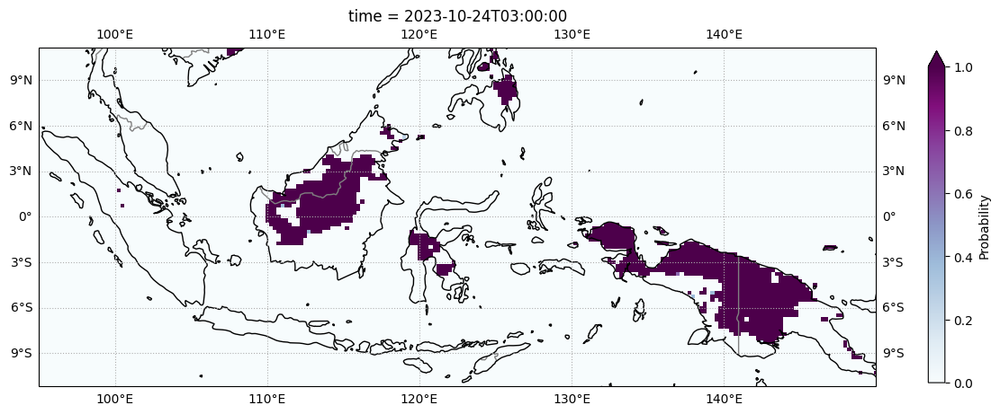

In [153]:
time='2023-10-24 03:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

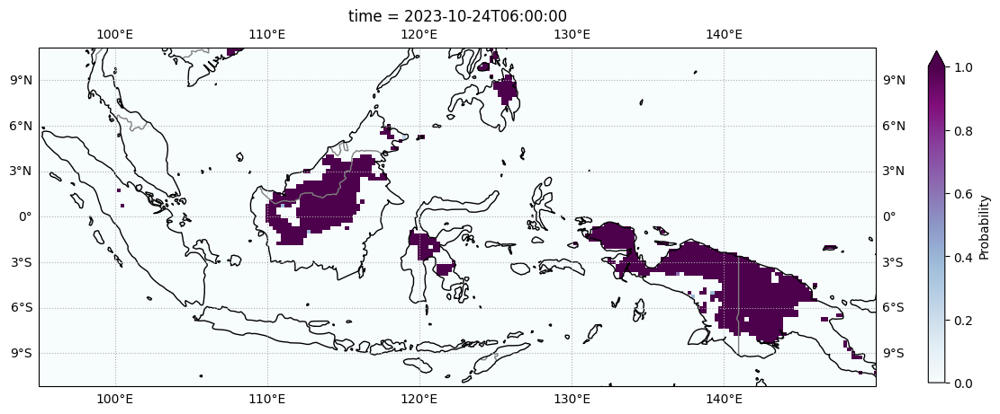

In [154]:
time='2023-10-24 06:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

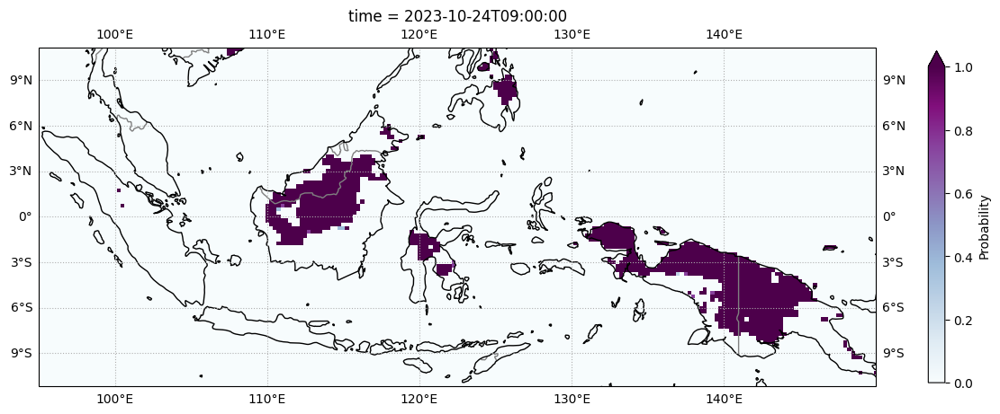

In [156]:
time='2023-10-24 09:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

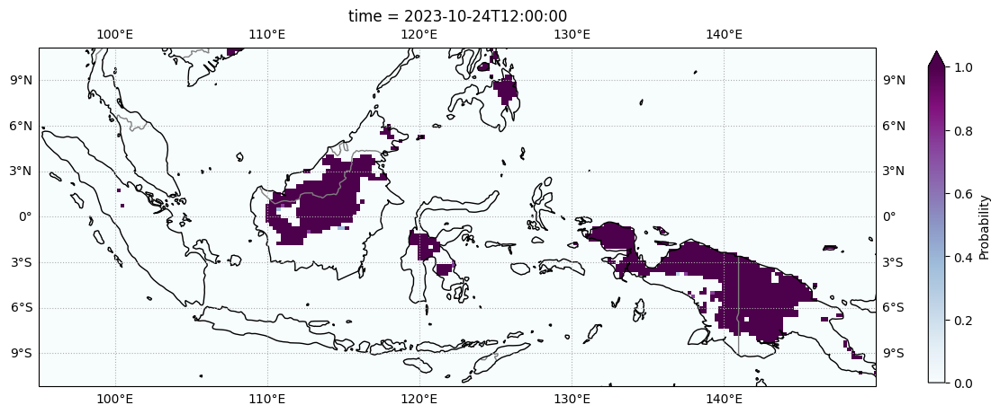

In [157]:
time='2023-10-24 12:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

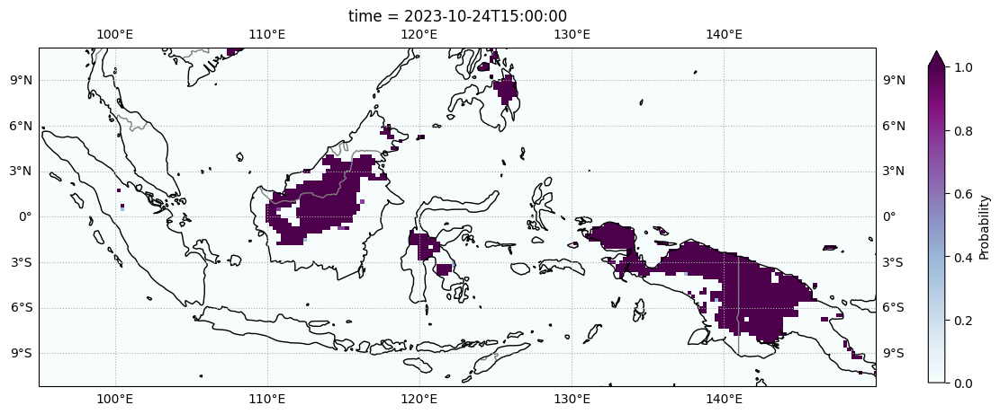

In [158]:
time='2023-10-24 15:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

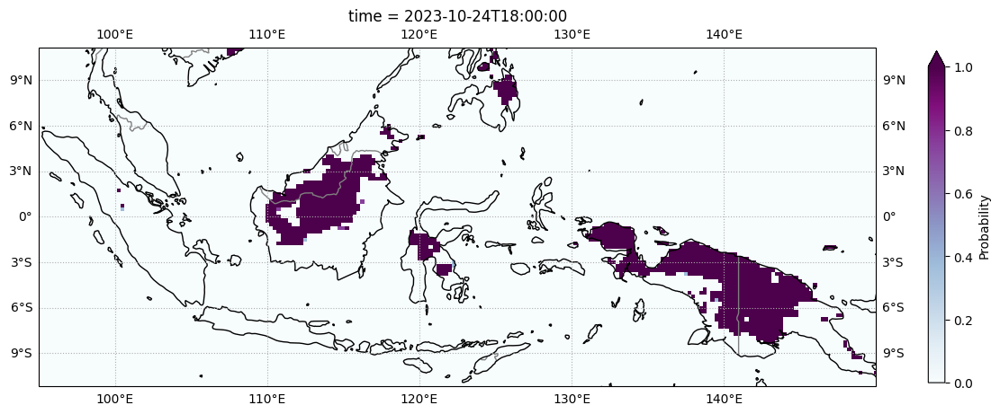

In [159]:
time='2023-10-24 18:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

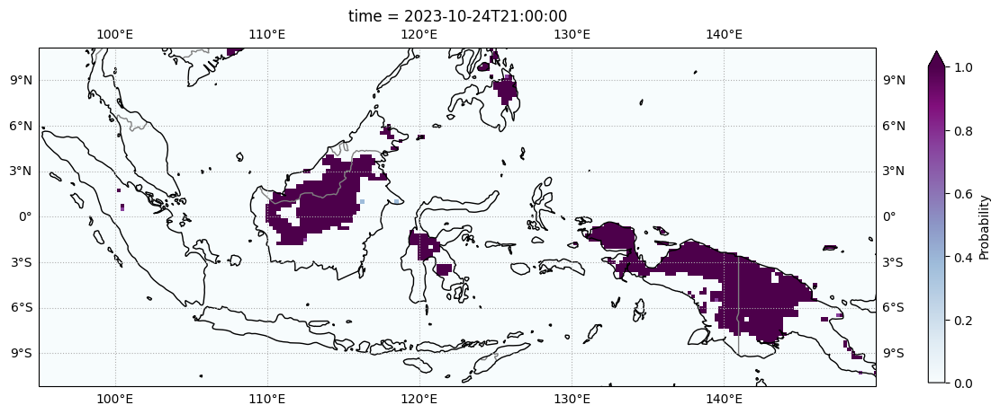

In [160]:
time='2023-10-24 21:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

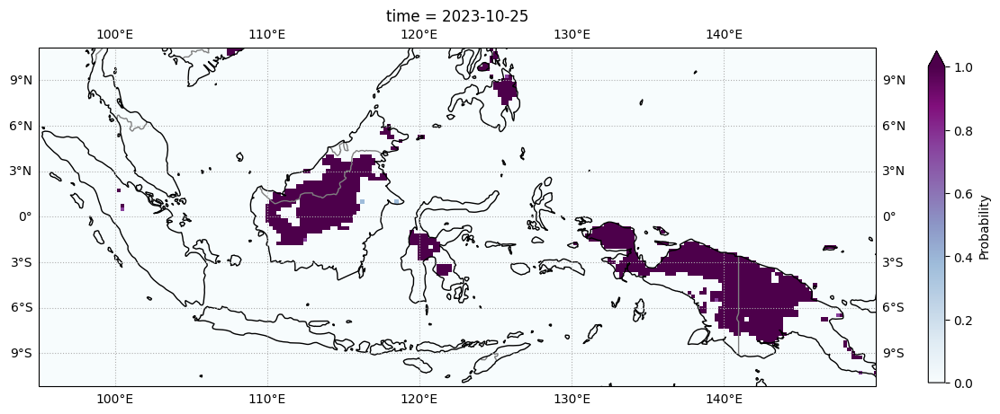

In [161]:
time='2023-10-25 00:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

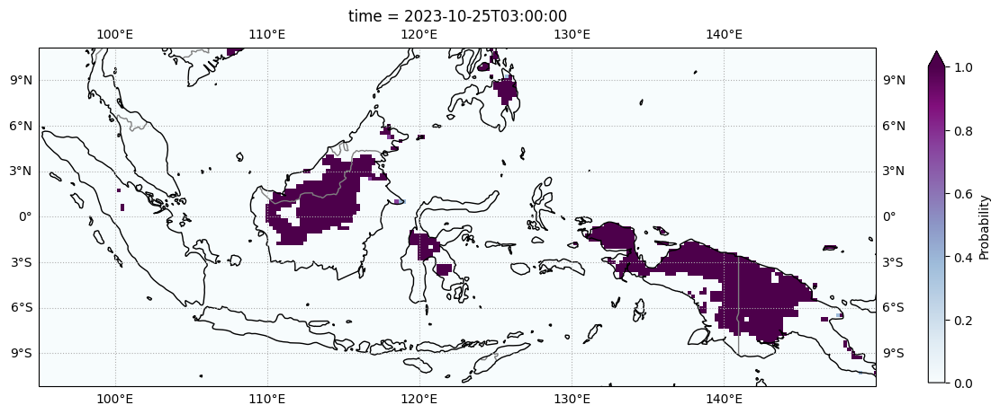

In [162]:
time='2023-10-25 03:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

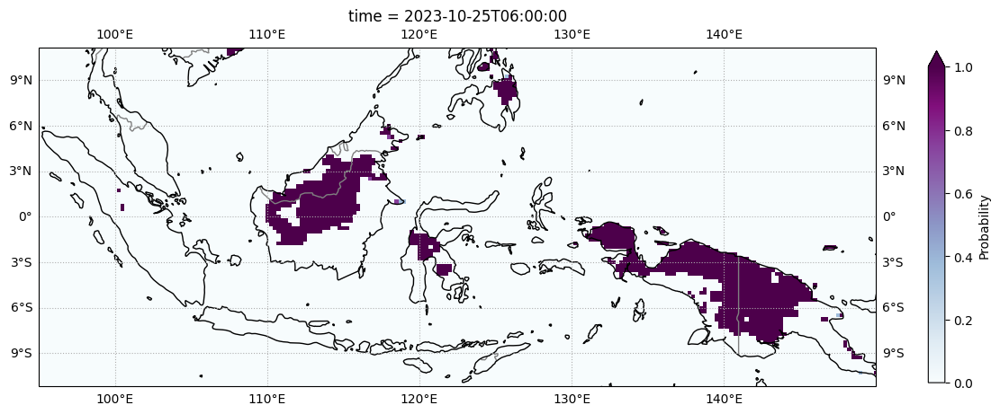

In [163]:
time='2023-10-25 06:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

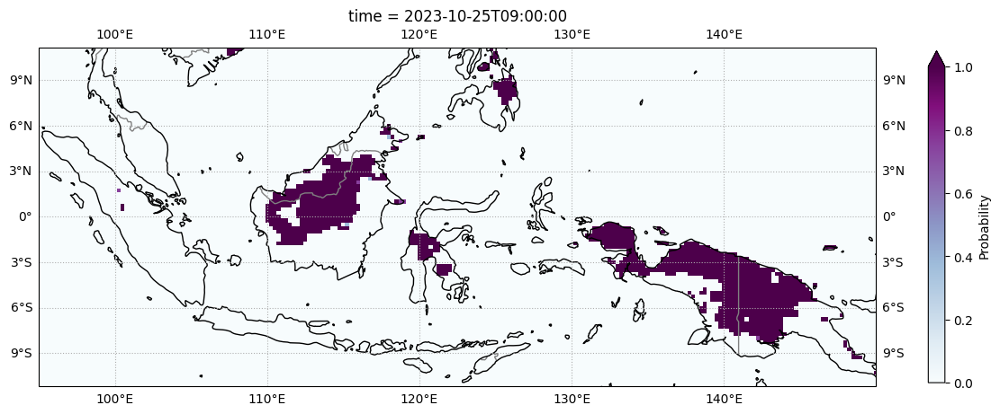

In [164]:
time='2023-10-25 09:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

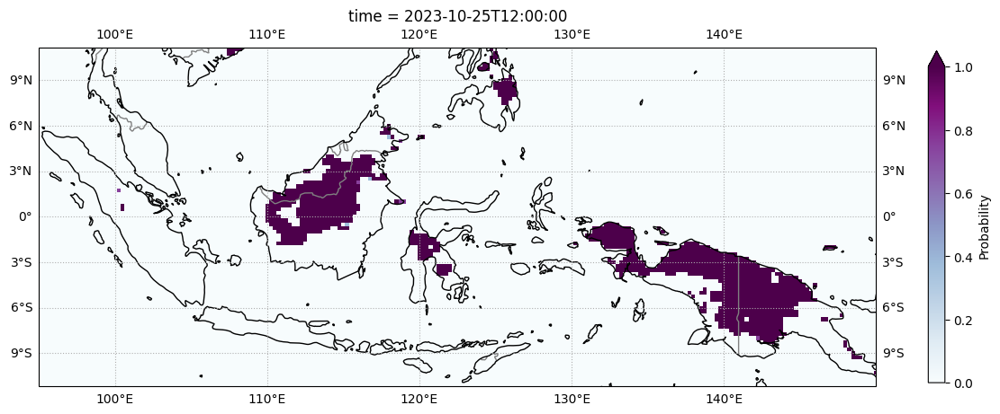

In [165]:
time='2023-10-25 12:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

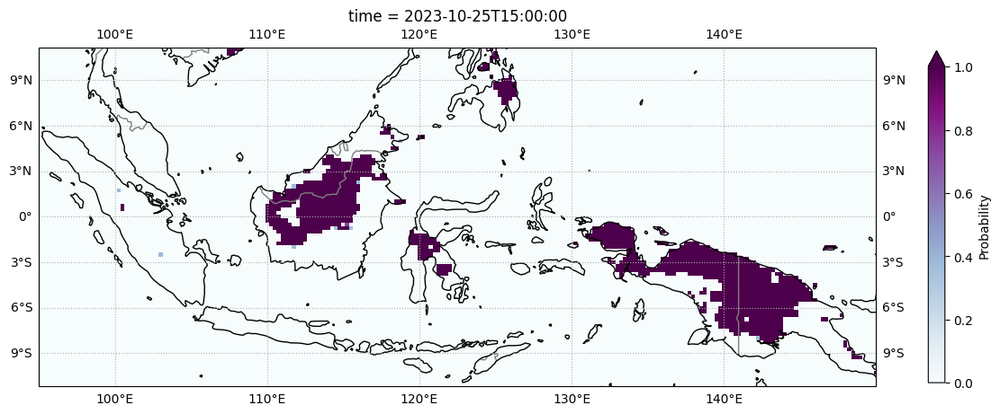

In [166]:
time='2023-10-25 15:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

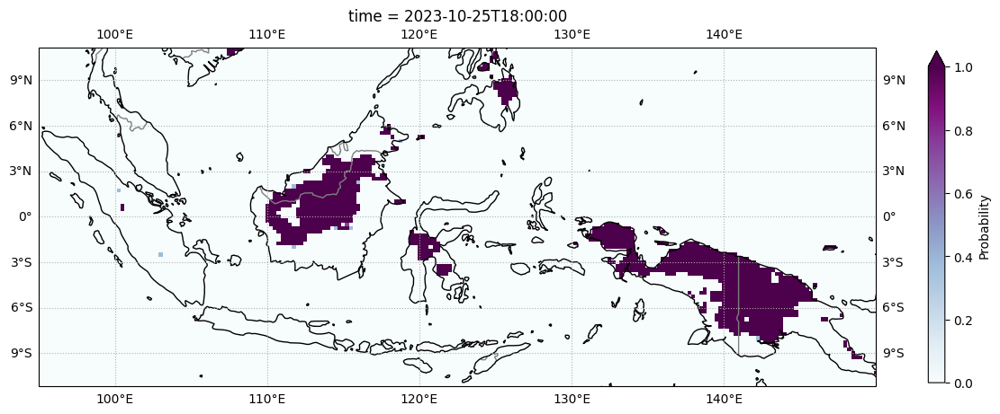

In [167]:
time='2023-10-25 18:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

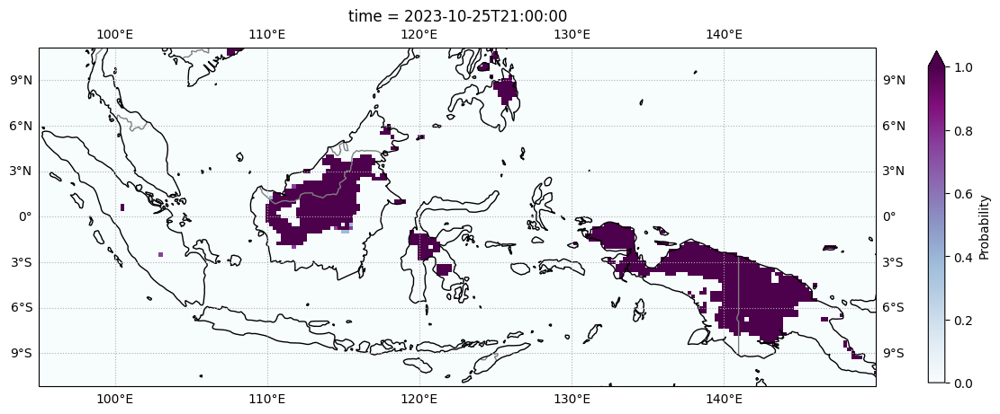

In [168]:
time='2023-10-25 21:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

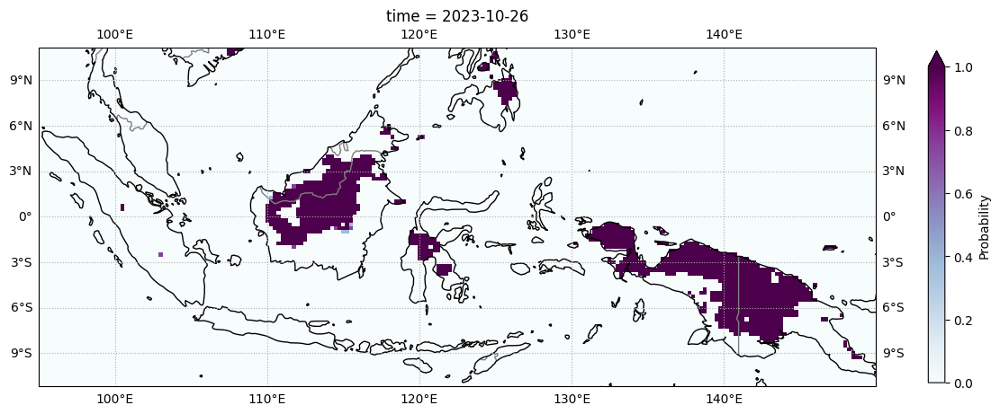

In [169]:
time='2023-10-26 00:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

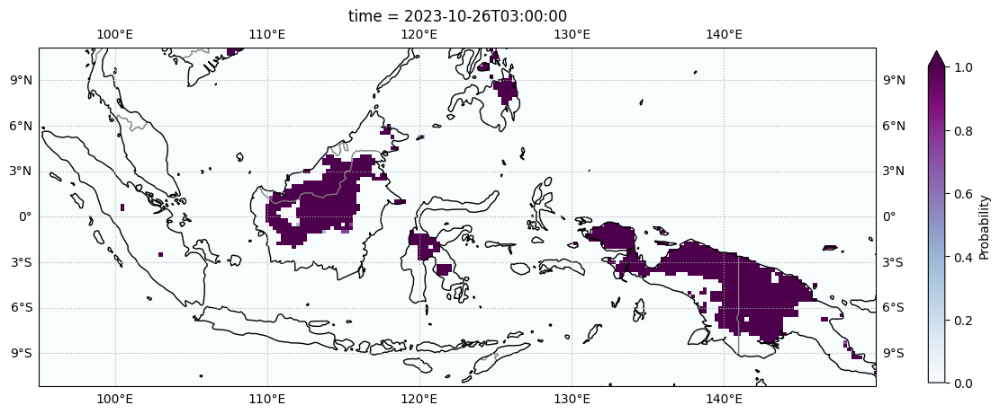

In [170]:
time='2023-10-26 03:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

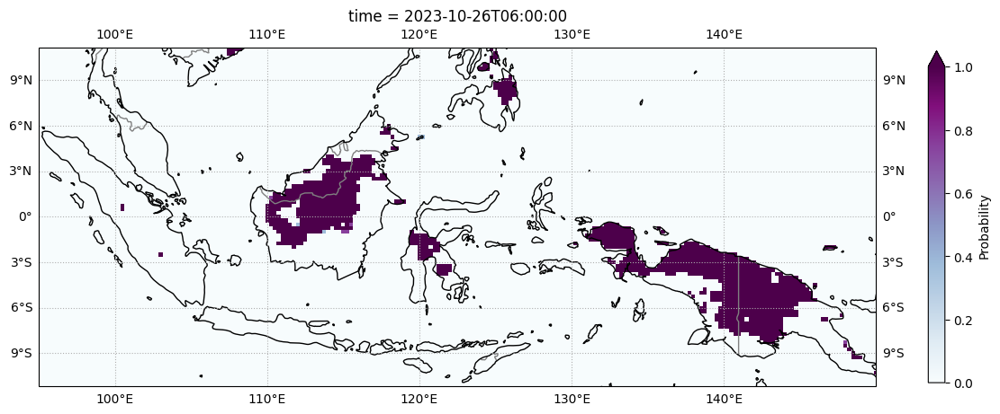

In [171]:
time='2023-10-26 06:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

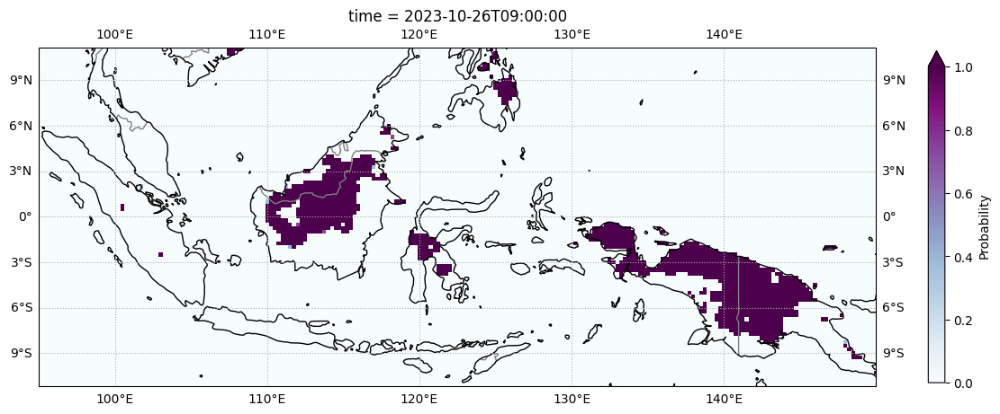

In [172]:
time='2023-10-26 09:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

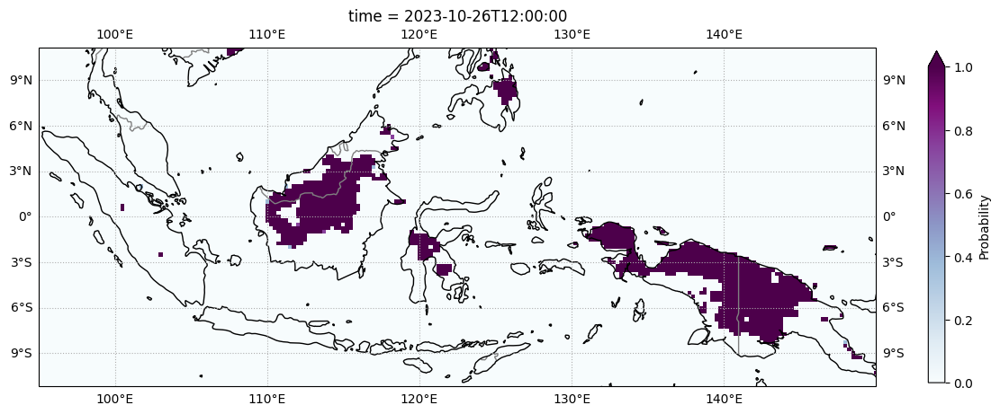

In [173]:
time='2023-10-26 12:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

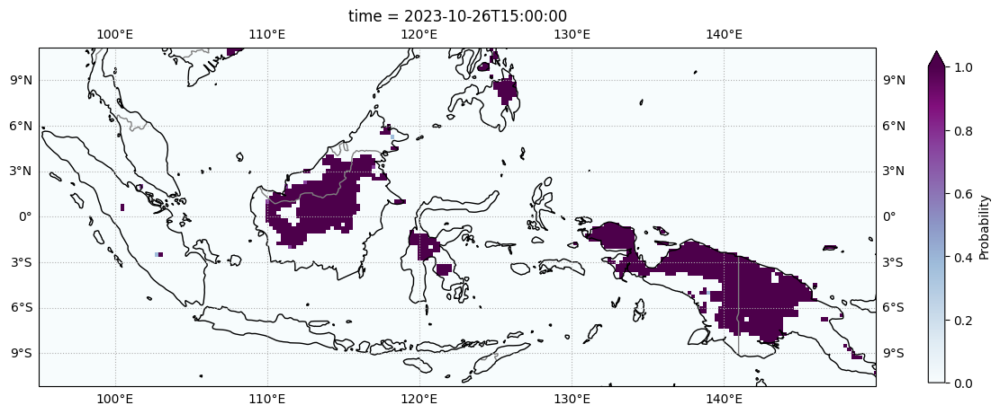

In [174]:
time='2023-10-26 15:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

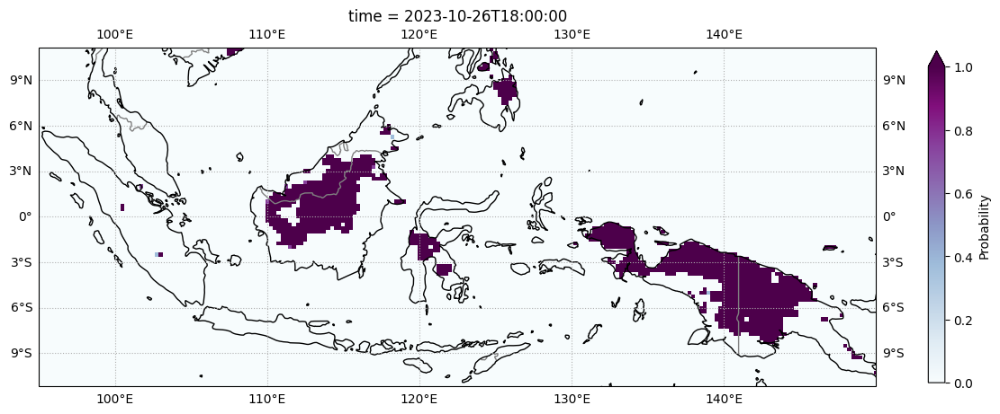

In [175]:
time='2023-10-26 18:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

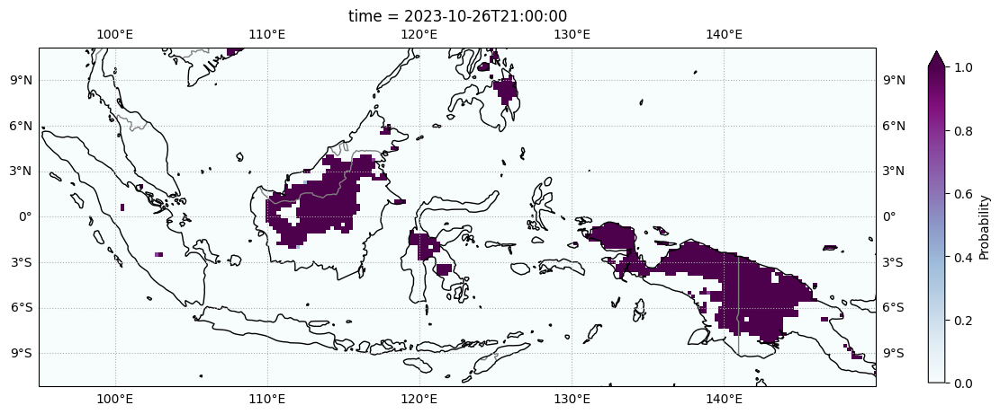

In [176]:
time='2023-10-26 21:00'
thold=70.0
#probabilitas value > thold
dat=cl_cover1[varname].sel(time=time)
prob=np.sum(dat>thold,axis=0)/8
#
fig = plt.figure(figsize=(15, 12))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([95, 150, -10, 10])
ax.add_feature(cfeature.BORDERS, edgecolor='gray')
ax.add_feature(cfeature.COASTLINE, edgecolor='black')
ax.gridlines(draw_labels=True,linestyle=':')

prob.plot(transform=ccrs.PlateCarree(),
          vmin=0.0,
          vmax=1.0,
          cmap='BuPu',
          cbar_kwargs={'shrink': 0.4,
                       'label':'Probability'},
          )

### **Meteogram**

Untuk Precipitation_rate_surface

In [149]:
rata2 = tlag_ens_3.resample(time='3H').mean()

<Axes: >

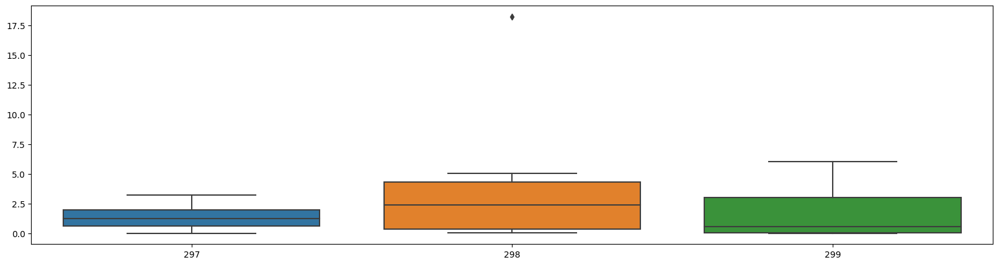

In [150]:
import matplotlib.pyplot as plt
import seaborn
import pandas as pd

ts = pd.Series(rata2['Precipitation_rate_surface'].sel(longitude=107.609810,
                                                            latitude=-6.914744,
                                                            method='nearest').mean(dim='member').values,
               index = rata2['time'].values)

fig, ax = plt.subplots(figsize=(20,5))
seaborn.boxplot(x = ts.index.dayofyear,
                y = ts,
                ax = ax)

Untuk Vegetation_surface

In [181]:
rata_rata = cl_cover1.resample(time='3H').mean()

<Axes: >

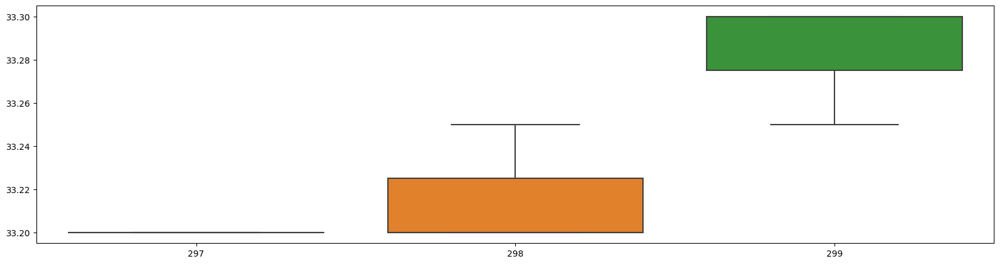

In [182]:
import matplotlib.pyplot as plt
import seaborn
import pandas as pd

ts = pd.Series(rata_rata['Vegetation_surface'].sel(longitude=107.609810,
                                                            latitude=-6.914744,
                                                            method='nearest').mean(dim='member').values,
               index = rata_rata['time'].values)

fig, ax = plt.subplots(figsize=(20,5))
seaborn.boxplot(x = ts.index.dayofyear,
                y = ts,
                ax = ax)

Untuk Total_cloud_cover_entire_atmosphere

In [196]:
rata_rata_k = cl_cover.resample(time='3H').mean()

<Axes: >

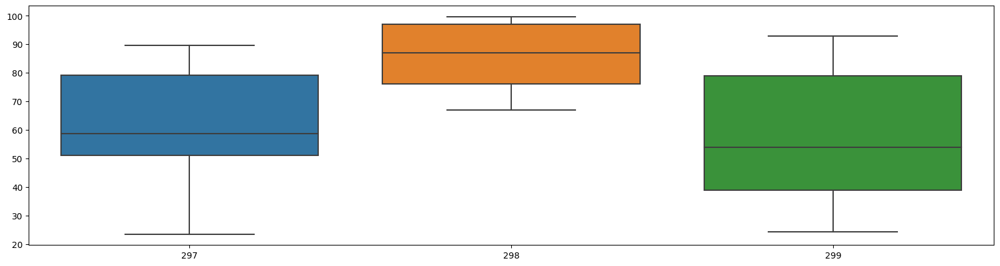

In [197]:
import matplotlib.pyplot as plt
import seaborn
import pandas as pd

ts = pd.Series(rata_rata_k['Total_cloud_cover_entire_atmosphere'].sel(longitude=107.609810,
                                                            latitude=-6.914744,
                                                            method='nearest').mean(dim='member').values,
               index = rata_rata_k['time'].values)

fig, ax = plt.subplots(figsize=(20,5))
seaborn.boxplot(x = ts.index.dayofyear,
                y = ts,
                ax = ax)
